<a href="https://colab.research.google.com/github/Ormager/or-app-1/blob/main/Thermal_Water_Stress_Detection_Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Tomato Plant Irrigation Stress Detection Using Thermal Imaging**  



## **Research Question**  
Can irrigation failure in tomato plants be detected using thermal imaging?

## **Experiment Overview**  
- The study was conducted on irrigated (C) and non-irrigated (T) tomato plants.  
- Measurements were taken over two weeks:  
  **Week 1:** 23-25.12.2024  
  **Week 2:** 07-09.01.2025  
- Data was collected at **13:00** each day to ensure consistency in environmental conditions.  
- Each measurement included:  
  - **Porometer readings (E-apparent)**  
  - **Thermal imaging data**  

## **Code Workflow**  

1. **Porometer Data Upload**  
   - Load, clean, and standardize **E-apparent** measurements.  

2. **Thermal Imaging Processing**  
   - **Preprocessing:** Central cropping (10% top/bottom), RGB → HSV conversion, Gaussian filtering.  
   - **Segmentation:** Color thresholding, morphological operations, bitwise masking.  
   - **Feature Extraction:** Apply binary mask to thermal data, isolate leaf temperature values, generate heatmaps.  

3. **Statistical Analysis**  
   - **T-Test:** Compare temperature distributions between treatment groups (T vs. C).  
   - **Pearson Correlation:** Evaluate relationships between leaf temperature and fluorescence data.  

4. **Comparison and Conclusions**  
   - Assess temperature variations, stomatal response, and thermal imaging feasibility for early water stress detection.    

## **URL**:
1. Poject overview- [https://bit.ly/Project-Overview-Docs](https://)
2. Data-set- [https://bit.ly/Data-Set-Project](https://)
3. Github Or Mager- [https://github.com/Ormager](https://)
4. Github Omri Sivan- [https://github.com/Omrisi37](https://)

## **References**
1. https://pygeostatistics.readthedocs.io/en/latest/tutorials/NST.html
2. The dataset was sourced from Yedidya Harris' research on detecting irrigation failures in tomato plants using thermal imaging.
3. https://github.com/oguztoraman/leaf-segmentation/blob/main/leaf_segmentation.py
4. ChatGPT 4o
5. Perplexity ai



In [ ]:
# @title ### Setting - mounting colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Part 1- Poromoter**
At this part:
1. We will import the Porometer Data
2. We will create informative table for  13 o'clock only, for T,C plants and for their E_apparent values only.

In [ ]:
# @title ## Importing Porometer data and filtering it into tables for the relavnt hour
import os
import pandas as pd
from glob import glob

# Path's
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Original_Porometer_Df"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Filter_Porometer_Df"

# Create output directory if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Plant ID mappings
T_ids = [1, 2, 3, 4, 5, 46, 47, 48, 49, 50]
C_ids = [61, 62, 63, 64, 65]

# Process each CSV file in the input folder
for file_path in glob(os.path.join(input_folder, "*.csv")):
    try:
        # Read the CSV file while skipping the first row and column
        df = pd.read_csv(file_path, skiprows=1).iloc[:, 1:]

        # Keep only the relevant columns
        df_filtered = df[["Date", "Time", "Plant ID", "E_apparent"]]

        # Filter rows where Time starts with "13"
        df_filtered = df_filtered[df_filtered["Time"].str.startswith("13")]

        # Filter rows where Plant ID is in the specified lists
        df_filtered = df_filtered[df_filtered["Plant ID"].isin(T_ids + C_ids)]

        # Map Plant ID to T or C
        df_filtered["Plant ID"] = df_filtered["Plant ID"].apply(
            lambda x: "T" if x in T_ids else "C"
        )

        # Save the filtered dataframe to the output folder
        output_file_path = os.path.join(output_folder, os.path.basename(file_path))
        df_filtered.to_csv(output_file_path, index=False)

    except Exception as e:
        print(f"Error processing file {file_path}: {e}")


# **Part 2 - Thermal Imaging**
At this part - we perform image segmention on all the images- Main limitation's we got -

1. Salt & Pepper noise's - after dirst segmention we got a few pixels with noise's at the background, the solution - we cut by 10% the image from above and beyond.
2. On the 9 o'cklock images the segmentation didnt perform well on all leaves. The shade in some part of the image made it difficult for the first segmention to recognize the whole leaves, the solution - balance histogram to divide brightness equaly. Unfotunatley the solution did not succeed and we decided that this images will be less important for us in this part.



מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 08012025_1300_T4-right_C-left


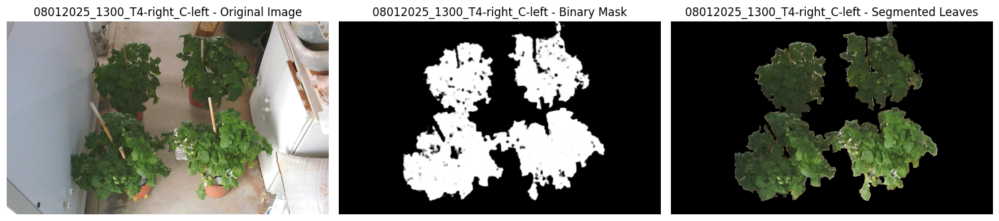

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T4- RGB.jpg
סגמנטציה נשמרה עבור: 08012025_1300_T4


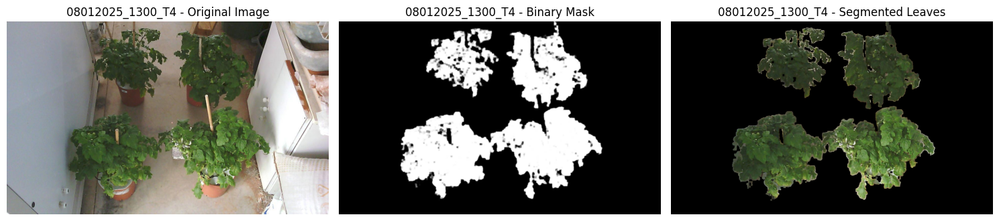

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T2-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 08012025_1300_T2-right_C-left


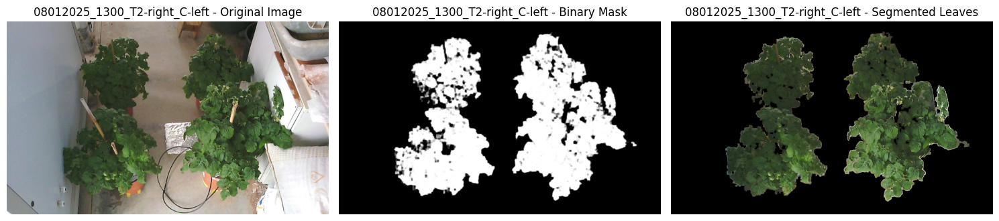

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T2- RGB.jpg
סגמנטציה נשמרה עבור: 08012025_1300_T2


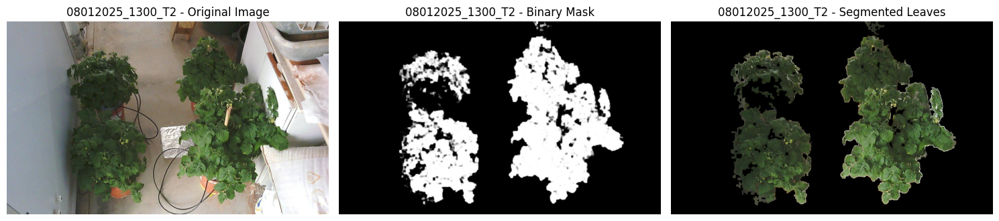

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_C- RGB.jpg
סגמנטציה נשמרה עבור: 08012025_1300_C


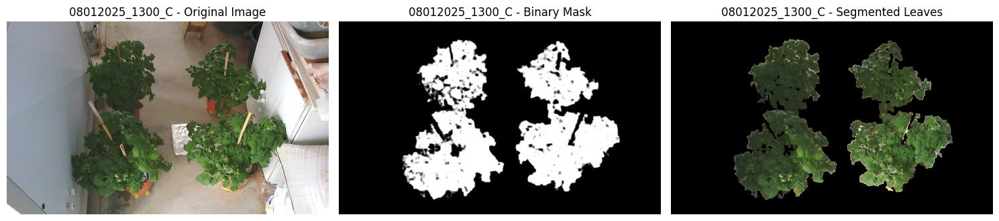

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 09012025_1300_T4-right_C-left


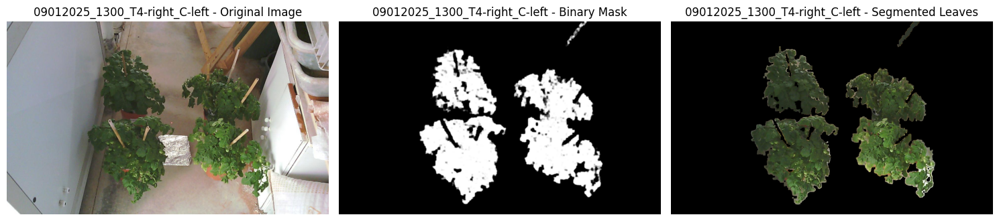

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T4- RGB.jpg
סגמנטציה נשמרה עבור: 09012025_1300_T4


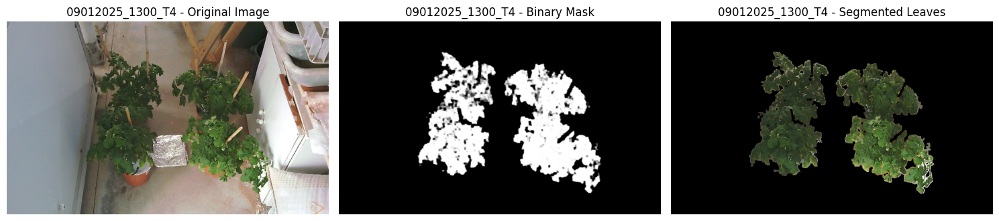

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T2-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 09012025_1300_T2-right_C-left


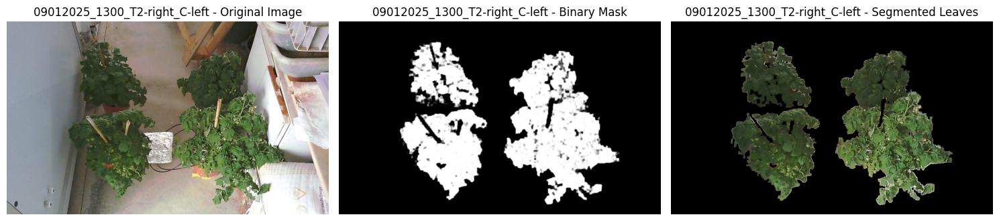

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_C- RGB.jpg
סגמנטציה נשמרה עבור: 09012025_1300_C


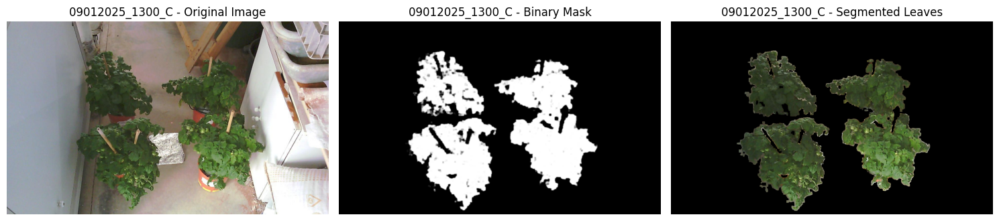

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T2- RGB.jpg
סגמנטציה נשמרה עבור: 09012025_1300_T2


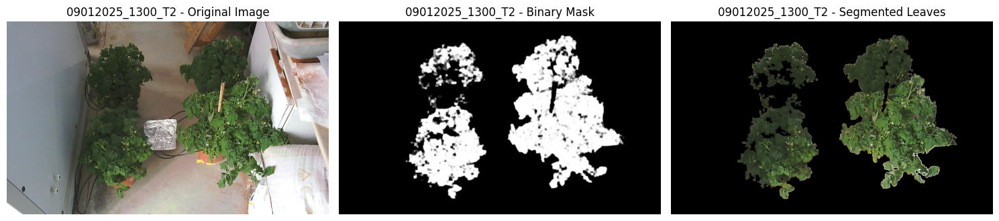

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 07012025_1300_T4-right_C-left


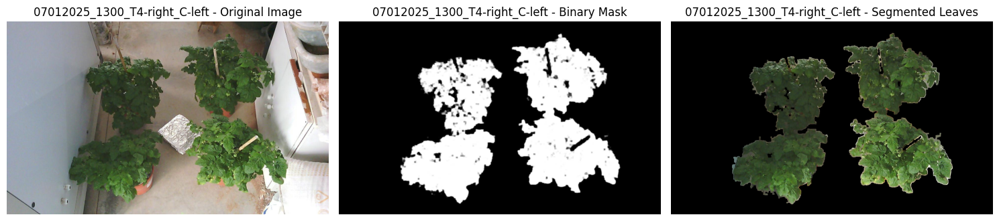

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T2-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 07012025_1300_T2-right_C-left


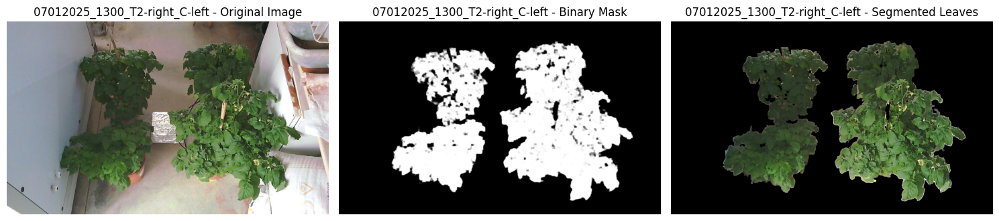

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T2- RGB.jpg
סגמנטציה נשמרה עבור: 07012025_1300_T2


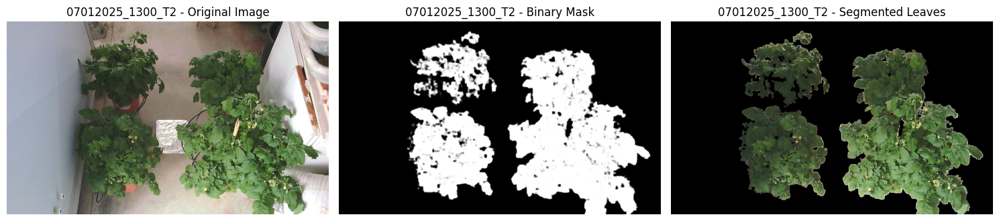

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_C- RGB.jpg
סגמנטציה נשמרה עבור: 07012025_1300_C


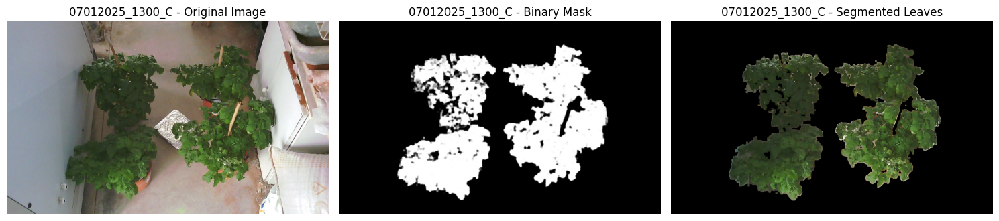

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T4- RGB.jpg
סגמנטציה נשמרה עבור: 07012025_1300_T4


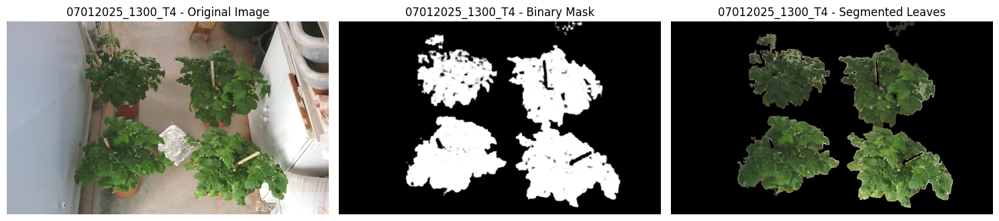

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_C- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_1300_C


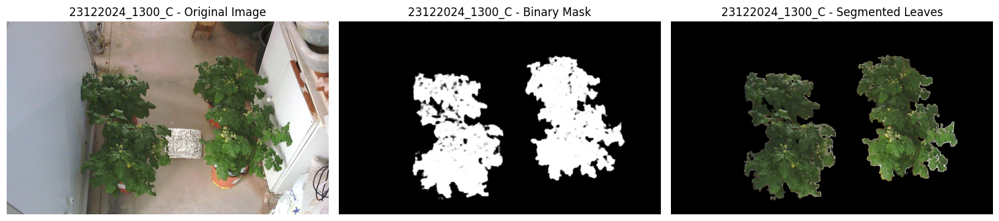

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T1- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_1300_T1


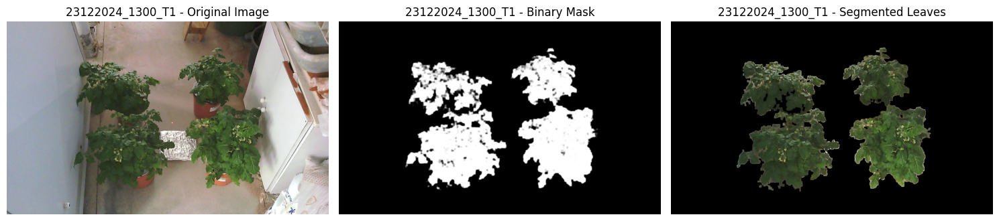

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T1-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_1300_T1-right_C-left


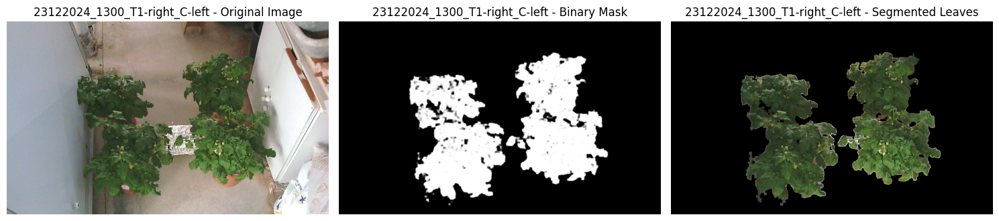

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_1300_T4-right_C-left


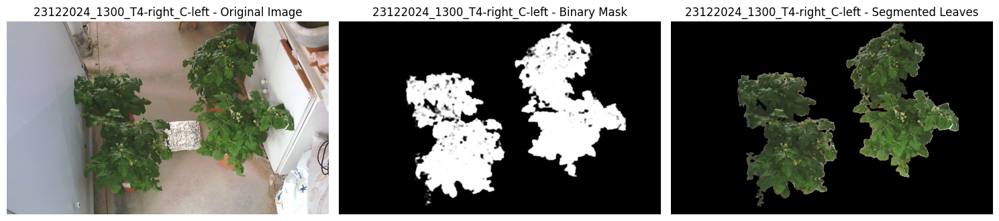

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T4- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_1300_T4


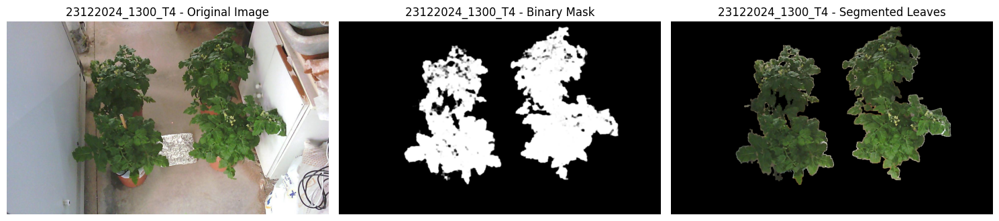

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_C- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_0900_C


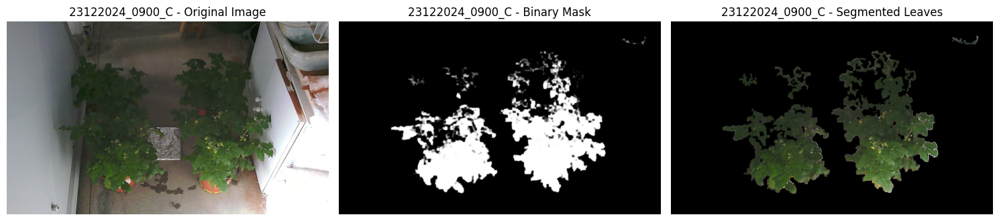

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T4- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_0900_T4


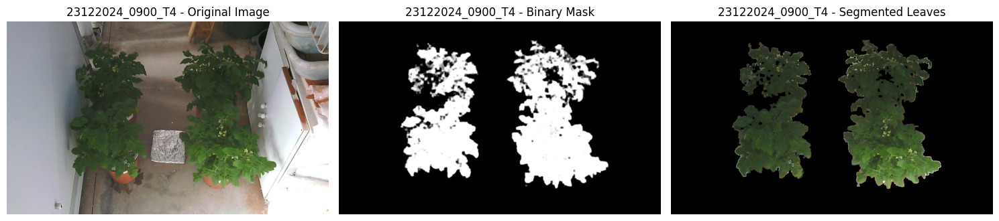

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_0900_T4-right_C-left


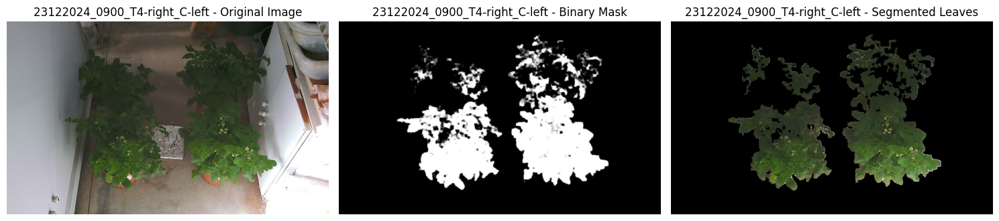

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T1-right_C-left- RGB.jpg
לא ניתן לקרוא תמונה: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T1-right_C-left- RGB.jpg
לא הצליח לעבד: 23122024_0900_T1-right_C-left
מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T1- RGB.jpg
סגמנטציה נשמרה עבור: 23122024_0900_T1


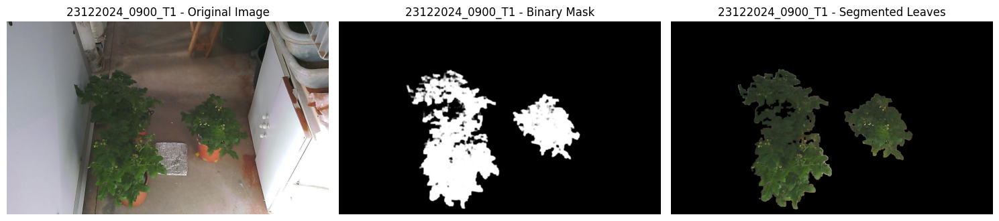

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_0900_T4-right_C-left


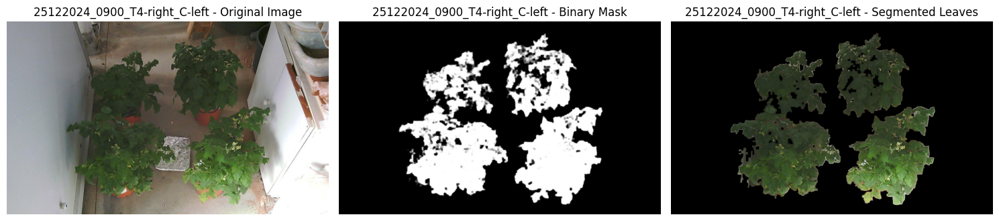

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T4- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_0900_T4


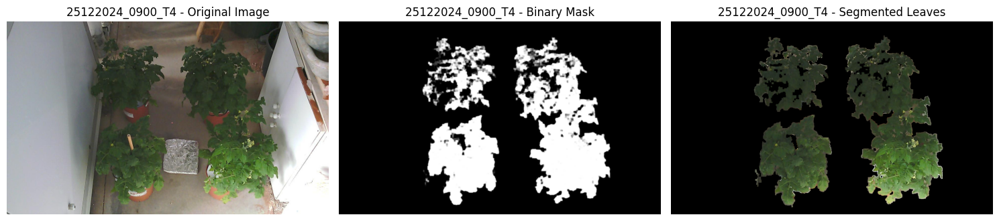

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T1-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_0900_T1-right_C-left


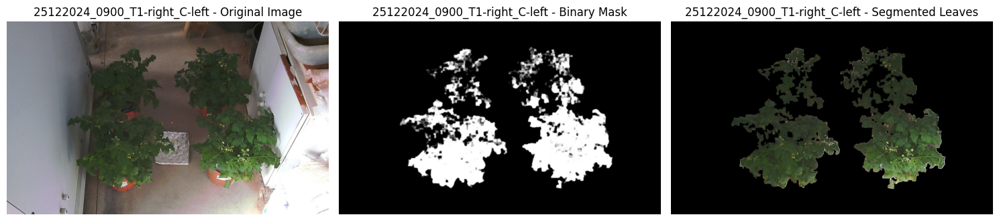

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T1- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_0900_T1


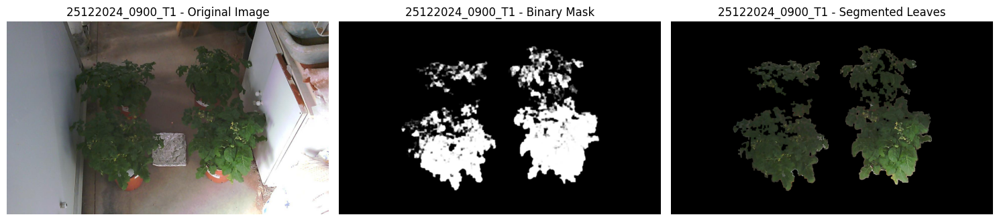

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_C- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_0900_C


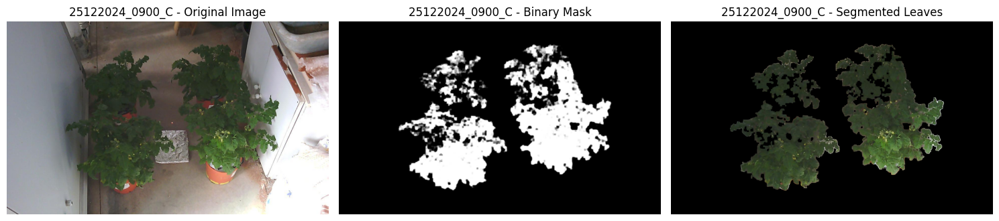

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_1300_T4-right_C-left


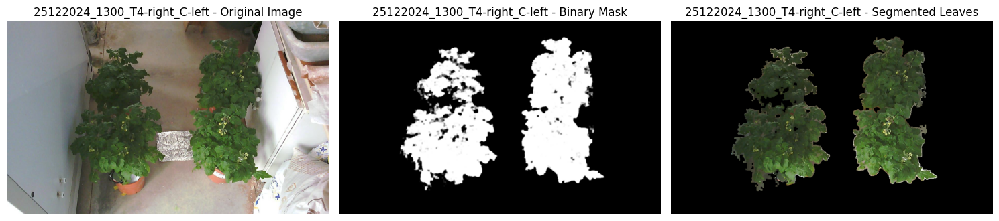

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_C- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_1300_C


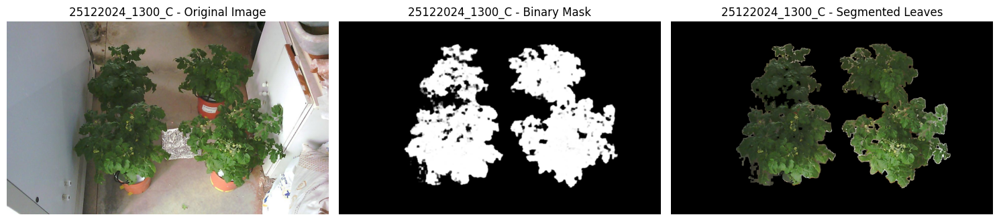

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T1- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_1300_T1


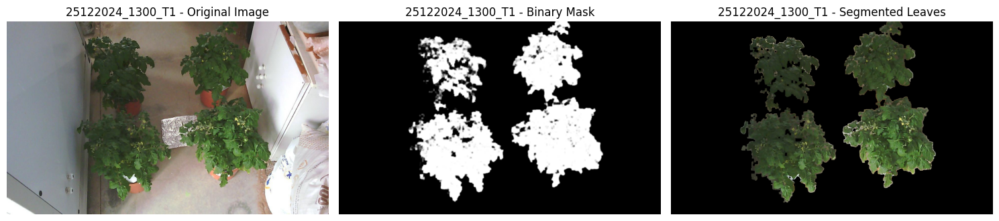

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T1-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_1300_T1-right_C-left


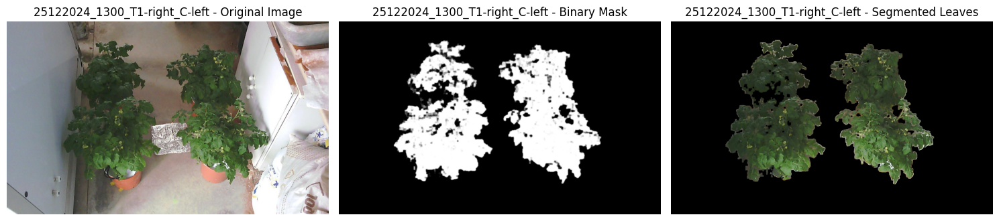

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T4- RGB.jpg
סגמנטציה נשמרה עבור: 25122024_1300_T4


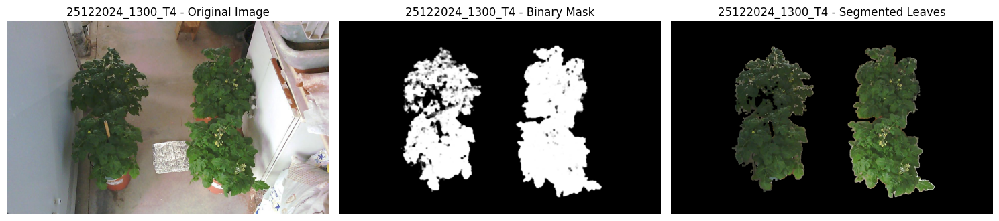

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_C- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_1300_C


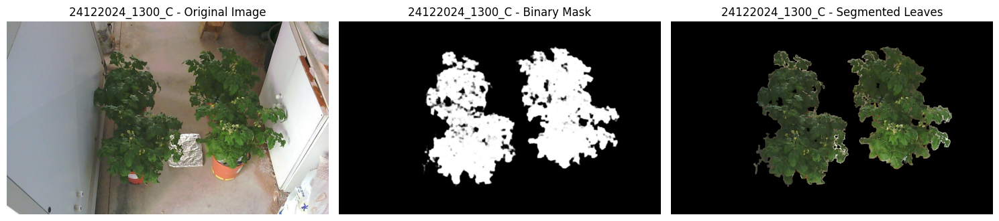

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T1- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_1300_T1


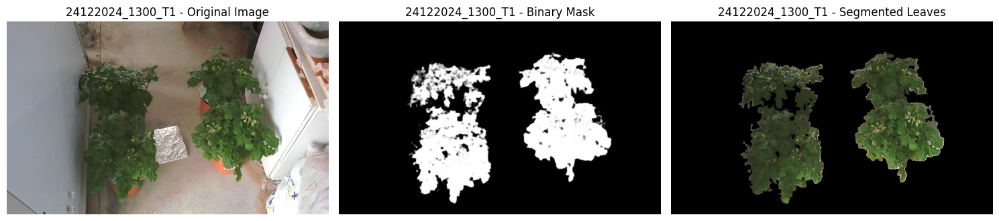

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T1-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_1300_T1-right_C-left


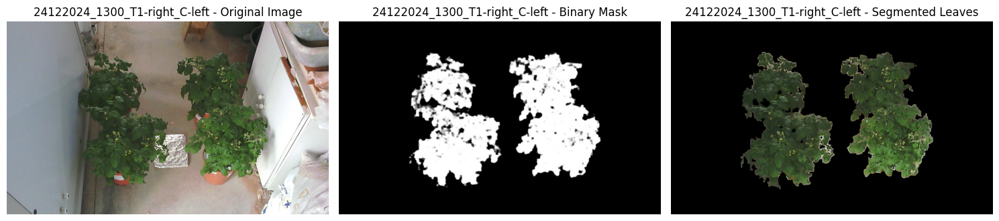

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T4- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_1300_T4


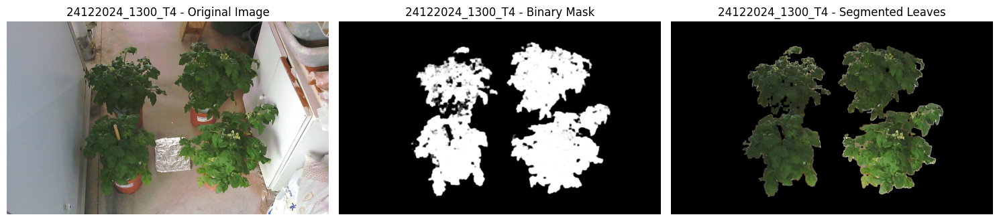

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_1300_T4-right_C-left


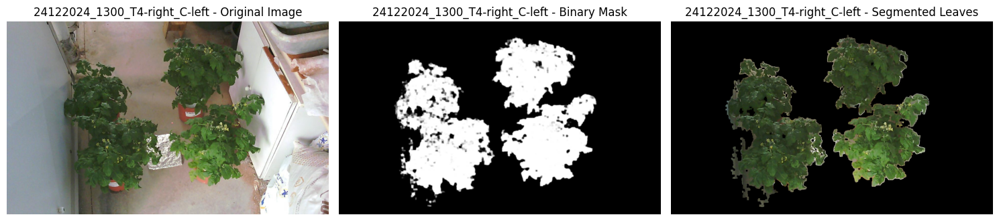

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T4-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_0900_T4-right_C-left


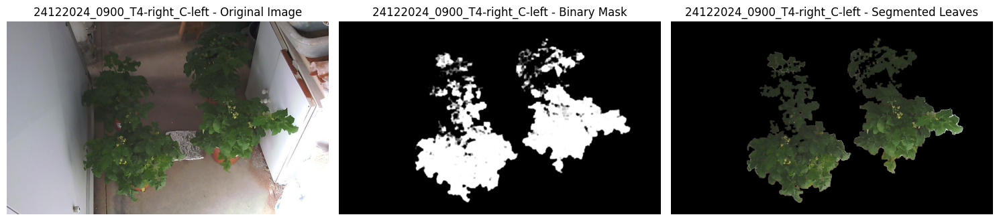

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T1-right_C-left- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_0900_T1-right_C-left


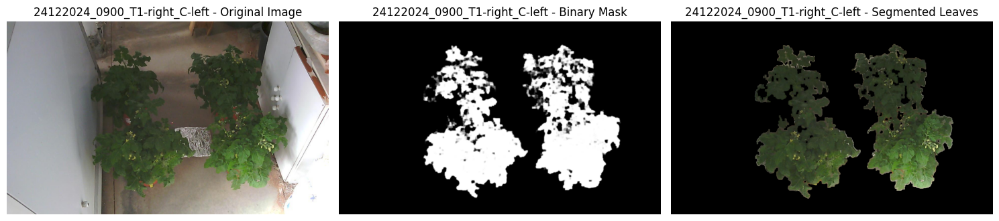

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T1- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_0900_T1


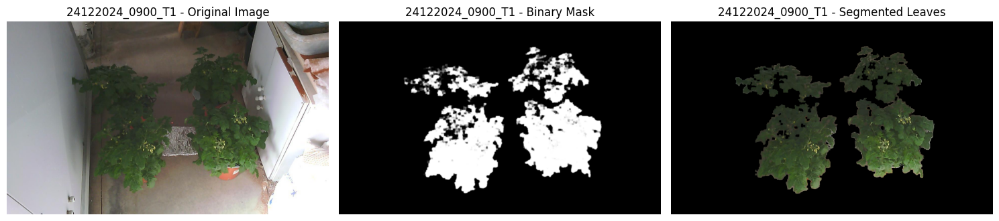

מנסה לעבד: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_C- RGB.jpg
סגמנטציה נשמרה עבור: 24122024_0900_C


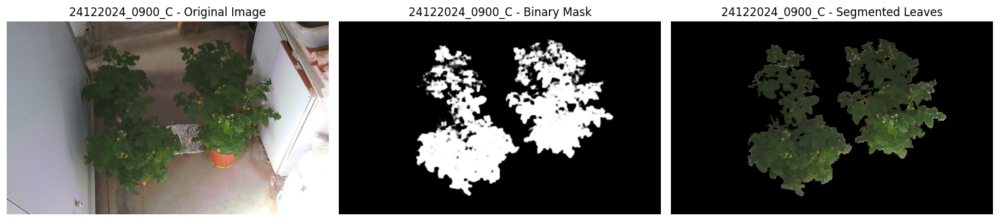

In [ ]:
# @title ## Images segmentation
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def crop_image_center(image, top_percent=10, bottom_percent=10):
     """
    Crop the image from top and bottom, keeping the center
    """
    height, width = image.shape[:2]
    top_cut = int(height * (top_percent / 100))
    bottom_cut = int(height * (bottom_percent / 100))
    cropped_image = image[top_cut:height - bottom_cut, :]
    return cropped_image

def check_for_sun_shadow(image):
    """
    Check if the image contains half sun and half shadow based on histogram
    """
    # Converting into grayscale and caclute histogram
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    histogram = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

    total_pixels = np.sum(histogram)
    threshold = total_pixels / 2

    left_sum = np.sum(histogram[:128])  # Left half of histogram
    right_sum = np.sum(histogram[128:])  # Right half of histogram

    return left_sum > threshold and right_sum > threshold

def equalize_histogram(image):
    """
    Apply histogram equalization to the image
    """
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    equalized_image = cv2.equalizeHist(gray_image)

    return cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2RGB)

def segment_rgb_image(image_path):
    if not os.path.exists(image_path):
        print(f"קובץ לא נמצא: {image_path}")
        return None, None

    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"לא ניתן לקרוא תמונה: {image_path}")
            return None, None

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = crop_image_center(image)

         # Check for sun-shadow condition
        if check_for_sun_shadow(image):
            print("Half sun and half shadow detected. Performing histogram equalization.")
            image = equalize_histogram(image)

         # Display equalized image for verification
            plt.figure(figsize=(8, 6))
            plt.imshow(image)
            plt.title("Image After Histogram Equalization")
            plt.axis('off')
            plt.show()

        # Convert image to HSV color space for better color segmentation
        hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        # Define range of green color in HSV
        lower_green = np.array([30, 50, 50])
        upper_green = np.array([90, 255, 255])
        # Create a mask for green colors
        mask = cv2.inRange(hsv_image, lower_green, upper_green)
        # Apply Gaussian blur to reduce noise
        blurred_mask = cv2.GaussianBlur(mask, (5, 5), 0)
        # Define kernel for morphological operations
        kernel = np.ones((5, 5), np.uint8)

        cleaned_mask = cv2.morphologyEx(blurred_mask, cv2.MORPH_CLOSE, kernel)
        cleaned_mask = cv2.morphologyEx(cleaned_mask, cv2.MORPH_OPEN, kernel)

        # Find contours in the mask
        contours, _ = cv2.findContours(cleaned_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        # Remove small contours (likely noise)
        min_contour_area = 1000
        for contour in contours:
            if cv2.contourArea(contour) < min_contour_area:
                cv2.drawContours(cleaned_mask, [contour], -1, (0), thickness=cv2.FILLED)

        segmented_leaves = cv2.bitwise_and(image, image, mask=cleaned_mask)

        return cleaned_mask, segmented_leaves

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None, None

def display_images(original_image, mask_image, segmented_image, base_name):
    plt.figure(figsize=(15, 10))

    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title(f'{base_name} - Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask_image, cmap='gray')
    plt.title(f'{base_name} - Binary Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(segmented_image)
    plt.title(f'{base_name} - Segmented Leaves')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Input and output paths
input_path = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/project-temp'
output_base_path = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA_PROCESSED'

# Create output subdirectories
os.makedirs(os.path.join(output_base_path, 'RGB_Masks'), exist_ok=True)
os.makedirs(os.path.join(output_base_path, 'Segmented_Leaves'), exist_ok=True)

# Process files
for root, dirs, files in os.walk(input_path):
    for file in files:
        if file.endswith('RGB.jpg'):
            base_name = file.replace('- RGB.jpg', '')
            rgb_path = os.path.join(root, file)

            print(f"Attempting to process: {rgb_path}")

            cleaned_mask, segmented_leaves = segment_rgb_image(rgb_path)
            original_image = cv2.imread(rgb_path)
            if original_image is not None:
                original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
                original_image = crop_image_center(original_image)

            if cleaned_mask is not None and segmented_leaves is not None:
                mask_output_path = os.path.join(output_base_path, 'RGB_Masks', f"{base_name}_mask.png")
                cv2.imwrite(mask_output_path, cleaned_mask)

                segmented_output_path = os.path.join(output_base_path, 'Segmented_Leaves', f"{base_name}_segmented.png")
                cv2.imwrite(segmented_output_path, cv2.cvtColor(segmented_leaves, cv2.COLOR_RGB2BGR))

                print(f"Segmentation saved for: {base_name}")

                display_images(original_image, cleaned_mask, segmented_leaves, base_name)

            else:
                print(f"Failed to process: {base_name}")



The coordinates of the binary mask were aligned with the three-channel original image and mapped onto the thermal image matrix. At this stage, image size was a limiting factor. We resized the binary mask from (1280, 786) to match the thermal image coordinates of (640, 478).

In [ ]:
# @title ## 2. Resized the binary mask from
import os
import cv2
import numpy as np
import pandas as pd

def find_csv_file(rgb_file_path):
    """Find the corresponding CSV file for a given RGB image file"""
    directory = os.path.dirname(rgb_file_path)
    base_name = os.path.basename(rgb_file_path).replace('- RGB.jpg', '')
    csv_file = f"{base_name}.csv"
    csv_path = os.path.join(directory, csv_file)
    return csv_path if os.path.exists(csv_path) else None

def find_mask_file(base_name, mask_directory):
    """Find the corresponding mask file for a given base name"""
    mask_file = f"{base_name}_mask.png"
    mask_path = os.path.join(mask_directory, mask_file)
    return mask_path if os.path.exists(mask_path) else None

def process_csv_with_mask(csv_path, mask):
    """Process CSV data using the provided mask"""
    try:
        # Read CSV file
        df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')
        print(f"Original DataFrame shape: {df.shape}")

        # Remove the first column
        df = df.iloc[:, 1:]
        data_array = df.to_numpy()
        print(f"Data array shape: {data_array.shape}")
        print(f"Original mask shape: {mask.shape}")

        # Resize mask to match data dimensions
        mask_resized = cv2.resize(mask, (data_array.shape[1], data_array.shape[0]), interpolation=cv2.INTER_NEAREST)
        print(f"Resized mask shape: {mask_resized.shape}")

        # Apply mask to data
        masked_data = np.where(mask_resized == 255, data_array, np.nan)
        return masked_data

    except Exception as e:
        print(f"Error processing CSV file: {csv_path}")
        print(f"Error details: {str(e)}")
        return None

def main():
    input_path = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/project-temp'
    mask_directory = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA_PROCESSED/RGB_Masks'

    processed_files = []
    unprocessed_files = []

    for root, dirs, files in os.walk(input_path):
        for file in files:
            if file.endswith('RGB.jpg'):
                base_name = file.replace('- RGB.jpg', '')
                rgb_path = os.path.join(root, file)

                mask_path = find_mask_file(base_name, mask_directory)
                if mask_path:
                    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

                    csv_path = find_csv_file(rgb_path)
                    if csv_path:
                        masked_data = process_csv_with_mask(csv_path, mask)
                        if masked_data is not None:
                            print(f"Mask applied to: {base_name}")
                            print(f"RGB file: {rgb_path}")
                            print(f"CSV file: {csv_path}")
                            print(f"Mask file: {mask_path}")
                            print(f"Masked data shape: {masked_data.shape}")
                            print(f"Number of non-NaN values: {np.count_nonzero(~np.isnan(masked_data))}")
                            print("-----")
                            processed_files.append(base_name)
                        else:
                            print(f"Problem applying mask to: {base_name}")
                            unprocessed_files.append(base_name)
                    else:
                        print(f"CSV file not found for: {base_name}")
                        unprocessed_files.append(base_name)
                else:
                    print(f"Mask file not found for: {base_name}")
                    unprocessed_files.append(base_name)

    # Print summary
    print("\nSummary:")
    print(f"Number of successfully processed files: {len(processed_files)}")
    print(f"Number of unprocessed files: {len(unprocessed_files)}")

    print("\nSuccessfully processed files:")
    for file in processed_files:
        print(file)

    print("\nUnprocessed files:")
    for file in unprocessed_files:
        print(file)

if __name__ == "__main__":
    main()


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 08012025_1300_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/08012025_1300_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 63716
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 08012025_1300_T4
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T4- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T4.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/08012025_1300_T4_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 55388
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 08012025_1300_T2-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T2-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T2-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/08012025_1300_T2-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 61477
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 08012025_1300_T2
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T2- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_T2.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/08012025_1300_T2_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 52106
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 08012025_1300_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_C- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/08012025/08012025_1300_C.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/08012025_1300_C_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 54758
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 09012025_1300_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/09012025_1300_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 40641
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 09012025_1300_T4
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T4- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T4.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/09012025_1300_T4_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 32106
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 09012025_1300_T2-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T2-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T2-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/09012025_1300_T2-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 48872
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 09012025_1300_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_C- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_C.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/09012025_1300_C_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 48065
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 09012025_1300_T2
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T2- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/09012025/09012025_1300_T2.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/09012025_1300_T2_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 36810
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 07012025_1300_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/07012025_1300_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 63618
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 07012025_1300_T2-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T2-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T2-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/07012025_1300_T2-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 68104
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 07012025_1300_T2
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T2- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T2.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/07012025_1300_T2_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 74346
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 07012025_1300_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_C- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_C.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/07012025_1300_C_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 55388
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 07012025_1300_T4
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T4- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/4stressdays_0709_01_2025/thermal/flir/07012025/07012025_1300_T4.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/07012025_1300_T4_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 65758
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_1300_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_C- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_C.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_1300_C_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 51443
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_1300_T1
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T1- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T1.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_1300_T1_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 42158
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_1300_T1-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T1-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T1-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_1300_T1-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 54382
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_1300_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_1300_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 54300
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_1300_T4
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T4- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/1300/23122024_1300_T4.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_1300_T4_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 51953
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_0900_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_C- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_C.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_0900_C_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 31864
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_0900_T4
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T4- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T4.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_0900_T4_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 48559
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_0900_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_0900_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 39050
-----
לא נמצא קובץ מסיכה עבור: 23122024_0900_T1-right_C-left


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 23122024_0900_T1
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T1- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/23122024/0900/23122024_0900_T1.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/23122024_0900_T1_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 29960
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_0900_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_0900_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 51452
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_0900_T4
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T4- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T4.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_0900_T4_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 46371
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_0900_T1-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T1-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T1-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_0900_T1-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 30977
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_0900_T1
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T1- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_T1.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_0900_T1_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 26358
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_0900_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_C- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/0900/25122024_0900_C.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_0900_C_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 35591
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_1300_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_1300_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 53187
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_1300_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_C- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_C.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_1300_C_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 55416
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_1300_T1
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T1- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T1.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_1300_T1_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 48140
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_1300_T1-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T1-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T1-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_1300_T1-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 46250
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 25122024_1300_T4
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T4- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/25122024/1300/25122024_1300_T4.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/25122024_1300_T4_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 49022
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_1300_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_C- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_C.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/24122024_1300_C_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 44757
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_1300_T1
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T1- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T1.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/24122024_1300_T1_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 42186
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_1300_T1-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T1-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T1-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/24122024_1300_T1-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 43826
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_1300_T4
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T4- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T4.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/24122024_1300_T4_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 52046
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_1300_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/1300/24122024_1300_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/24122024_1300_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 54225
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_0900_T4-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T4-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T4-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/24122024_0900_T4-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 38217
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_0900_T1-right_C-left
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T1-right_C-left- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T1-right_C-left.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/24122024_0900_T1-right_C-left_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 47347
-----


<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_0900_T1
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T1- RGB.jpg
קובץ CSV: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_T1.csv
קובץ מסיכה: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA_PROCESSED/RGB_Masks/24122024_0900_T1_mask.png
צורת הנתונים לאחר החלת המסיכה: (478, 640)
מספר ערכים שאינם NaN: 37401
-----
צורת ה-DataFrame המקורי: (478, 641)
צורת מערך הנתונים: (478, 640)
צורת המסיכה המקורית: (768, 1280)
צורת המסיכה לאחר שינוי גודל: (478, 640)
הוחלה מסיכה על: 24122024_0900_C
קובץ RGB: /content/drive/MyDrive/Final_project_or_omri/data_project/project-temp/2stressdays_2325_12_2024/thermal/flir/24122024/0900/24122024_0900_

<ipython-input-9-dcc9a7164c3a>:21: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


In [ ]:
# @title ## 3. Saving the thermal images and csv files
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def save_csv_and_image(base_name, masked_data, output_dir):
    """Save processed CSV and thermal image"""
    csv_output_dir = os.path.join(output_dir, "Processed_CSVs")
    image_output_dir = os.path.join(output_dir, "Thermal_Images")
    os.makedirs(csv_output_dir, exist_ok=True)
    os.makedirs(image_output_dir, exist_ok=True)

    # Save processed CSV
    csv_file_path = os.path.join(csv_output_dir, f"{base_name}_processed.csv")
    df = pd.DataFrame(masked_data)
    df.to_csv(csv_file_path, index=False, header=False)
    print(f"CSV file saved at: {csv_file_path}")

    # Generate and save thermal image
    thermal_image_path = os.path.join(image_output_dir, f"{base_name}_thermal.png")
    thermal_image = np.nan_to_num(masked_data, nan=np.nanmin(masked_data))
    plt.figure(figsize=(10, 8))
    plt.imshow(thermal_image, cmap='RdYlGn')
    plt.colorbar(label='Temperature')
    plt.title(f"Thermal Image - {base_name}")
    plt.axis('off')
    plt.savefig(thermal_image_path, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"Thermal image saved at: {thermal_image_path}")

def process_csv_with_mask(csv_path, mask):
    """Process CSV data using the provided mask"""
    try:
        df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')
        df = df.iloc[:, 1:]
        data_array = df.to_numpy()
        mask_resized = cv2.resize(mask, (data_array.shape[1], data_array.shape[0]), interpolation=cv2.INTER_NEAREST)
        masked_data = np.where(mask_resized == 255, data_array, np.nan)
        return masked_data
    except Exception as e:
        print(f"Error processing CSV file: {csv_path}")
        print(f"Error details: {str(e)}")
        return None

def main():
    input_path = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/project-temp'
    mask_directory = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA_PROCESSED'
    output_dir = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA-PROCEED1'

    for root, dirs, files in os.walk(input_path):
        for file in files:
            if file.endswith('RGB.jpg'):
                base_name = file.replace('- RGB.jpg', '')
                rgb_path = os.path.join(root, file)
                mask_path = os.path.join(mask_directory, f"{base_name}_mask.png")
                if os.path.exists(mask_path):
                    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                    csv_file_name = f"{base_name}.csv"
                    csv_path = os.path.join(root, csv_file_name)
                    if os.path.exists(csv_path):
                        masked_data = process_csv_with_mask(csv_path, mask)
                        if masked_data is not None:
                            save_csv_and_image(base_name, masked_data, output_dir)
                        else:
                            print(f"Problem applying mask to data for: {base_name}")
                    else:
                        print(f"CSV file not found for: {base_name}")
                else:
                    print(f"Mask file not found for: {base_name}")

if __name__ == "__main__":
    main()


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/08012025_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/08012025_1300_T4-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/08012025_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/08012025_1300_T4_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/08012025_1300_T2-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/08012025_1300_T2-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/08012025_1300_T2_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/08012025_1300_T2_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/08012025_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/08012025_1300_C_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/09012025_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/09012025_1300_T4-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/09012025_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/09012025_1300_T4_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/09012025_1300_T2-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/09012025_1300_T2-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/09012025_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/09012025_1300_C_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/09012025_1300_T2_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/09012025_1300_T2_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/07012025_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/07012025_1300_T4-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/07012025_1300_T2-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/07012025_1300_T2-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/07012025_1300_T2_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/07012025_1300_T2_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/07012025_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/07012025_1300_C_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/07012025_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/07012025_1300_T4_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_1300_C_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_1300_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_1300_T1_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_1300_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_1300_T1-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_1300_T4-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_1300_T4_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_0900_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_0900_C_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_0900_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_0900_T4_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_0900_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_0900_T4-right_C-left_thermal.png
לא נמצא קובץ מסיכה עבור: 23122024_0900_T1-right_C-left


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/23122024_0900_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/23122024_0900_T1_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_0900_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_0900_T4-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_0900_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_0900_T4_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_0900_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_0900_T1-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_0900_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_0900_T1_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_0900_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_0900_C_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_1300_T4-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_1300_C_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_1300_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_1300_T1_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_1300_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_1300_T1-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/25122024_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/25122024_1300_T4_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_1300_C_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_1300_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_1300_T1_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_1300_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_1300_T1-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_1300_T4_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_1300_T4-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_0900_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_0900_T4-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_0900_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_0900_T1-right_C-left_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_0900_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_0900_T1_thermal.png


<ipython-input-10-25a2653a30fa>:31: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Processed_CSVs/24122024_0900_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED1/Thermal_Images/24122024_0900_C_thermal.png


In [ ]:
# @title ## Printing other images in a different format
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def save_csv_and_image(base_name, masked_data, output_dir):
    """Save processed CSV and generate thermal image"""
    csv_output_dir = os.path.join(output_dir, "Processed_CSVs")
    image_output_dir = os.path.join(output_dir, "Thermal_Images")
    os.makedirs(csv_output_dir, exist_ok=True)
    os.makedirs(image_output_dir, exist_ok=True)

    # Save processed CSV
    csv_file_path = os.path.join(csv_output_dir, f"{base_name}_processed.csv")
    df = pd.DataFrame(masked_data)
    df.to_csv(csv_file_path, index=False, header=False)
    print(f"CSV file saved at: {csv_file_path}")

    # Generate thermal image
    thermal_image_path = os.path.join(image_output_dir, f"{base_name}_thermal.png")

    # White background for 0 or NONE
    thermal_image = np.nan_to_num(masked_data, nan=np.nan)
    plt.figure(figsize=(10, 8))
    plt.imshow(thermal_image, cmap='jet', vmin=19, vmax=26)

    # Add colorbar with temperature
    cbar = plt.colorbar(label='Temperature (°C)')

    # Define detailed title
    week_day_map = {
        '23122024': 'WEEK 1 DAY 1',
        '24122024': 'WEEK 1 DAY 2',
        '25122024': 'WEEK 1 DAY 3',
        '07012025': 'WEEK 2 DAY 1',
        '08012025': 'WEEK 2 DAY 2',
        '09012025': 'WEEK 2 DAY 3'
    }

    # Determine treatment type
    treatment_type = []
    if 'T' in base_name and 'C' in base_name:
        treatment_type = ['TREATMENT-RIGHT', 'CONTROL-LEFT']
    else:
        if 'T' in base_name:
            treatment_type.append('T TREATMENT')
        if 'C' in base_name:
            treatment_type.append('C CONTROL')

    # Add time to title
    time_map = {
        '0900': '9:00',
        '1300': '13:00'
    }

    # Extract time from name
    time_str = next((t for t in ['0900', '1300'] if t in base_name), '')
    formatted_time = time_map.get(time_str, '')

    # Build title
    title_parts = [
        week_day_map.get(base_name.split('_')[0], base_name),
        f"{formatted_time}" if formatted_time else "",
        f"- {' & '.join(treatment_type)}"
    ]

    title = " ".join(filter(bool, title_parts))

    plt.title(title)
    plt.axis('off')
    plt.savefig(thermal_image_path, dpi=300, bbox_inches='tight', facecolor='white')
    plt.close()
    print(f"Thermal image saved at: {thermal_image_path}")

def process_csv_with_mask(csv_path, mask):
    """Process CSV data using the provided mask"""
    try:
        df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')
        df = df.iloc[:, 1:]
        data_array = df.to_numpy()
        mask_resized = cv2.resize(mask, (data_array.shape[1], data_array.shape[0]), interpolation=cv2.INTER_NEAREST)
        masked_data = np.where(mask_resized == 255, data_array, np.nan)
        return masked_data
    except Exception as e:
        print(f"Error processing CSV file: {csv_path}")
        print(f"Error details: {str(e)}")
        return None

def main():
    input_path = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/project-temp'
    mask_directory = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA_PROCESSED'
    output_dir = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA-PROCEED2'  # Changed output path

    for root, dirs, files in os.walk(input_path):
        for file in files:
            if file.endswith('RGB.jpg'):
                base_name = file.replace('- RGB.jpg', '')
                rgb_path = os.path.join(root, file)

                # Try multiple mask filename options
                mask_options = [
                    f"{base_name}_mask.png",
                    f"{base_name}-mask.png",
                    f"{base_name}.png",
                    f"mask_{base_name}.png"
                ]

                mask_found = False
                for mask_filename in mask_options:
                    mask_path = os.path.join(mask_directory, mask_filename)
                    if os.path.exists(mask_path):
                        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                        csv_file_name = f"{base_name}.csv"
                        csv_path = os.path.join(root, csv_file_name)
                        if os.path.exists(csv_path):
                            masked_data = process_csv_with_mask(csv_path, mask)
                            if masked_data is not None:
                                save_csv_and_image(base_name, masked_data, output_dir)
                            else:
                                print(f"Problem applying mask to data for: {base_name}")
                        else:
                            print(f"CSV file not found for: {base_name}")

                        mask_found = True
                        break

                if not mask_found:
                    print(f"Mask file not found for: {base_name}")

if __name__ == "__main__":
    main()


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/08012025_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/08012025_1300_T4-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/08012025_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/08012025_1300_T4_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/08012025_1300_T2-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/08012025_1300_T2-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/08012025_1300_T2_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/08012025_1300_T2_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/08012025_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/08012025_1300_C_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/09012025_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/09012025_1300_T4-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/09012025_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/09012025_1300_T4_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/09012025_1300_T2-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/09012025_1300_T2-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/09012025_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/09012025_1300_C_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/09012025_1300_T2_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/09012025_1300_T2_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/07012025_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/07012025_1300_T4-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/07012025_1300_T2-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/07012025_1300_T2-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/07012025_1300_T2_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/07012025_1300_T2_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/07012025_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/07012025_1300_C_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/07012025_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/07012025_1300_T4_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_1300_C_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_1300_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_1300_T1_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_1300_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_1300_T1-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_1300_T4-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_1300_T4_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_0900_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_0900_C_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_0900_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_0900_T4_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_0900_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_0900_T4-right_C-left_thermal.png
לא נמצא קובץ מסיכה עבור: 23122024_0900_T1-right_C-left


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/23122024_0900_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/23122024_0900_T1_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_0900_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_0900_T4-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_0900_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_0900_T4_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_0900_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_0900_T1-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_0900_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_0900_T1_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_0900_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_0900_C_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_1300_T4-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_1300_C_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_1300_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_1300_T1_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_1300_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_1300_T1-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/25122024_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/25122024_1300_T4_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_1300_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_1300_C_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_1300_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_1300_T1_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_1300_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_1300_T1-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_1300_T4_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_1300_T4_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_1300_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_1300_T4-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_0900_T4-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_0900_T4-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_0900_T1-right_C-left_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_0900_T1-right_C-left_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_0900_T1_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_0900_T1_thermal.png


<ipython-input-15-15bae0d4414e>:75: ParserWarning: Skipping line 482: expected 641 fields, saw 642

  df = pd.read_csv(csv_path, skiprows=2, on_bad_lines='warn')


קובץ CSV נשמר ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Processed_CSVs/24122024_0900_C_processed.csv
תמונה תרמית נשמרה ב: /content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/Thermal_Images/24122024_0900_C_thermal.png


In [ ]:
# @title ## Printing RGB images we took photo of that containg both T & C groups to compare between them
import os
from PIL import Image

def combine_images():
    # Path to the directory with thermal images
    thermal_dir = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA-PROCEED2/Thermal_Images'

    # Path to the directory with RGB images
    rgb_dir = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA_PROCESSED/Segmented_Leaves'

    # Destination directory for saving combined images
    destination_dir = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA-PROCEED2/T_and_C_Combined'
    os.makedirs(destination_dir, exist_ok=True)

    # Find pairs of thermal images
    thermal_images = [f for f in os.listdir(thermal_dir) if f.endswith('_thermal.png') and 'T' in f and 'C' in f]

    if not thermal_images:
        print("No thermal images with T and C found.")
        return

    for thermal_image_name in thermal_images:
        # Extract base name for thermal image
        base_name = thermal_image_name[:-12]  # Remove '_thermal.png' suffix

        # Find matching RGB image with '_segmented.png' suffix
        rgb_image_name = base_name + '_segmented.png'

        # Check if images exist
        thermal_path = os.path.join(thermal_dir, thermal_image_name)
        rgb_path = os.path.join(rgb_dir, rgb_image_name)

        if not os.path.exists(thermal_path):
            print(f"Thermal image not found: {thermal_path}")
            continue

        if not os.path.exists(rgb_path):
            print(f"RGB image not found: {rgb_path}")
            continue

        # Load images
        thermal_img = Image.open(thermal_path)
        rgb_img = Image.open(rgb_path)

        # Resize images to the same size
        width = min(thermal_img.width, rgb_img.width)
        height = min(thermal_img.height, rgb_img.height)
        thermal_img = thermal_img.resize((width, height))
        rgb_img = rgb_img.resize((width, height))

        # Create combined image
        combined_img = Image.new('RGB', (width * 2, height))
        combined_img.paste(thermal_img, (0, 0))
        combined_img.paste(rgb_img, (width, 0))

        # Save combined image
        output_path = os.path.join(destination_dir, f"{base_name}_combined.jpg")
        combined_img.save(output_path)

        print(f"Combined: {thermal_image_name} with {rgb_image_name} and saved to {output_path}")

# Run the function
combine_images()


שולב: 08012025_1300_T4-right_C-left_thermal.png עם 08012025_1300_T4-right_C-left_segmented.png ונשמר ב-/content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/T_and_C_Combined/08012025_1300_T4-right_C-left_combined.jpg
שולב: 08012025_1300_T2-right_C-left_thermal.png עם 08012025_1300_T2-right_C-left_segmented.png ונשמר ב-/content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/T_and_C_Combined/08012025_1300_T2-right_C-left_combined.jpg
שולב: 09012025_1300_T4-right_C-left_thermal.png עם 09012025_1300_T4-right_C-left_segmented.png ונשמר ב-/content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/T_and_C_Combined/09012025_1300_T4-right_C-left_combined.jpg
שולב: 09012025_1300_T2-right_C-left_thermal.png עם 09012025_1300_T2-right_C-left_segmented.png ונשמר ב-/content/drive/MyDrive/Final_project_or_omri/data_project/DATA-PROCEED2/T_and_C_Combined/09012025_1300_T2-right_C-left_combined.jpg
שולב: 07012025_1300_T4-right_C-left_thermal.png עם 07012025_

In [ ]:
# @title ## 4. Creeating a Dictionary of pixel values after applying binary mask
import os
import pandas as pd
import numpy as np
import pickle

def create_temperature_dictionary(csv_directory):
    """Create a dictionary of temperature values from processed CSV files"""
    temperature_dict = {}

    for filename in os.listdir(csv_directory):
        if filename.endswith('_processed.csv') and 'left' not in filename.lower() and 'right' not in filename.lower():
            base_name = filename.replace('_processed.csv', '')
            file_path = os.path.join(csv_directory, filename)

            # Read the CSV file
            df = pd.read_csv(file_path, header=None)

            # Filter out 0 and NaN values
            valid_values = df.values[(df.values != 0) & (~np.isnan(df.values))]

            # Add to dictionary
            temperature_dict[base_name] = valid_values.tolist()

    return temperature_dict

def main():
    # Path to the processed CSV directory
    csv_directory = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA-PROCEED1/Processed_CSVs'

    # Create the dictionary
    temperature_dict = create_temperature_dictionary(csv_directory)

    # Print the dictionary (for verification purposes)
    for key, value in temperature_dict.items():
        print(f"{key}: {len(value)} values")
        print(f"Sample values: {value[:5]}...")
        print()

    # Save the dictionary
    output_file = 'temperature_dictionary.pkl'
    with open(output_file, 'wb') as f:
        pickle.dump(temperature_dict, f)

    print(f"Dictionary saved to file '{output_file}'")

if __name__ == "__main__":
    main()


08012025_1300_T4: 55388 ערכים
דוגמה לערכים: [23.444, 23.429, 23.382, 23.382, 23.305]...

08012025_1300_T2: 52106 ערכים
דוגמה לערכים: [19.813, 19.974, 20.583, 21.425, 21.757]...

08012025_1300_C: 54758 ערכים
דוגמה לערכים: [21.214, 21.182, 21.214, 21.198, 21.182]...

09012025_1300_T4: 32106 ערכים
דוגמה לערכים: [21.097, 21.097, 21.081, 21.081, 21.097]...

09012025_1300_C: 48065 ערכים
דוגמה לערכים: [20.981, 20.997, 20.981, 20.981, 20.981]...

09012025_1300_T2: 36810 ערכים
דוגמה לערכים: [23.445, 23.646, 23.785, 23.243, 23.631]...

07012025_1300_T2: 74346 ערכים
דוגמה לערכים: [21.394, 21.331, 21.188, 20.966, 21.426]...

07012025_1300_C: 55388 ערכים
דוגמה לערכים: [20.387, 20.403, 20.435, 20.483, 20.69]...

07012025_1300_T4: 65758 ערכים
דוגמה לערכים: [20.584, 20.584, 20.584, 20.584, 20.584]...

23122024_1300_C: 51443 ערכים
דוגמה לערכים: [19.907, 19.907, 19.891, 19.923, 19.907]...

23122024_1300_T1: 42158 ערכים
דוגמה לערכים: [20.339, 20.323, 20.339, 20.323, 20.355]...

23122024_1300_T4: 51953 ער

In [ ]:
# @title ## Creating a dictionary that the keys are the treatment names and the values are the tempartures on the specific leave on the specific date Only for plants in the same treatment category
import os
import pandas as pd
import numpy as np
import pickle

def create_temperature_dictionary(csv_directory):
    """Create a dictionary of temperature values from processed CSV files"""
    temperature_dict = {}

    for filename in os.listdir(csv_directory):
        if filename.endswith('_processed.csv') and 'left' not in filename.lower() and 'right' not in filename.lower():
            base_name = filename.replace('_processed.csv', '')
            file_path = os.path.join(csv_directory, filename)

            df = pd.read_csv(file_path, header=None)
            valid_values = df.values[(df.values != 0) & (~np.isnan(df.values))]
            temperature_dict[base_name] = valid_values.tolist()

    return temperature_dict

def main():
    # Path to the directory containing processed CSV files
    csv_directory = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA-PROCEED1/Processed_CSVs'
    temperature_dict = create_temperature_dictionary(csv_directory)

    # Print information about the dictionary
    for key, value in temperature_dict.items():
        print(f"{key}: {len(value)} values")
        print(f"Sample values: {value[:5]}...")
        print()

    # Save the dictionary to a specified path
    output_file = '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA-PROCEED2/temperature_dictionary.pkl'
    with open(output_file, 'wb') as f:
        pickle.dump(temperature_dict, f)
    print(f"Dictionary saved to file: {output_file}")

if __name__ == "__main__":
    main()


08012025_1300_T4: 55388 ערכים
דוגמה לערכים: [23.444, 23.429, 23.382, 23.382, 23.305]...

08012025_1300_T2: 52106 ערכים
דוגמה לערכים: [19.813, 19.974, 20.583, 21.425, 21.757]...

08012025_1300_C: 54758 ערכים
דוגמה לערכים: [21.214, 21.182, 21.214, 21.198, 21.182]...

09012025_1300_T4: 32106 ערכים
דוגמה לערכים: [21.097, 21.097, 21.081, 21.081, 21.097]...

09012025_1300_C: 48065 ערכים
דוגמה לערכים: [20.981, 20.997, 20.981, 20.981, 20.981]...

09012025_1300_T2: 36810 ערכים
דוגמה לערכים: [23.445, 23.646, 23.785, 23.243, 23.631]...

07012025_1300_T2: 74346 ערכים
דוגמה לערכים: [21.394, 21.331, 21.188, 20.966, 21.426]...

07012025_1300_C: 55388 ערכים
דוגמה לערכים: [20.387, 20.403, 20.435, 20.483, 20.69]...

07012025_1300_T4: 65758 ערכים
דוגמה לערכים: [20.584, 20.584, 20.584, 20.584, 20.584]...

23122024_1300_C: 51443 ערכים
דוגמה לערכים: [19.907, 19.907, 19.891, 19.923, 19.907]...

23122024_1300_T1: 42158 ערכים
דוגמה לערכים: [20.339, 20.323, 20.339, 20.323, 20.355]...

23122024_1300_T4: 51953 ער

In [ ]:
# @title ## 5. Creating tables of temparture for the same day for 2 types of treatments T,C
import os
import pandas as pd
import pickle

# Paths
input_file = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/DATA-PROCEED2/temperature_dictionary.pkl"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Load the temperature dictionary
with open(input_file, "rb") as f:
    temperature_dict = pickle.load(f)

# Filter and process data for hour 1300
filtered_data = {}
for key, values in temperature_dict.items():
    # Split the key to extract date, time, and treatment type
    parts = key.split("_")
    date = parts[0]
    time = parts[1]
    treatment = parts[2]

    # Only process entries for 1300 hour
    if time == "1300":
        # Treat T1, T2, T4 as T
        if treatment.startswith("T"):
            treatment = "T"

        # Group data by date and treatment type
        if date not in filtered_data:
            filtered_data[date] = {}
        if treatment not in filtered_data[date]:
            filtered_data[date][treatment] = []
        filtered_data[date][treatment].extend(values)

# Create a DataFrame for each date and save it as a CSV file
for date, treatments in filtered_data.items():
    # Prepare data for the DataFrame
    rows = []
    for treatment, values in treatments.items():
        for value in values:
            rows.append({"Date": date, "Treatment": treatment, "Value": value})

    # Convert to DataFrame
    df = pd.DataFrame(rows)

    # Save the DataFrame to a CSV file
    output_file = os.path.join(output_folder, f"{date}_1300_combined.csv")
    df.to_csv(output_file, index=False)
    print(f"Processed and saved: {output_file}")


Processed and saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/08012025_1300_combined.csv
Processed and saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/09012025_1300_combined.csv
Processed and saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/07012025_1300_combined.csv
Processed and saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/23122024_1300_combined.csv
Processed and saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/25122024_1300_combined.csv
Processed and saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/24122024_1300_combined.csv


# **Part 3- Statistical Analysis: T-Test**  

At this stage, we will perform a **T-test** separately for the **porometer data (E-apparent)** and **temperature measurements**.  
The comparison will be conducted between different days.
Since there are numerous temperature data points per day, the statistical tests yield **p-values of 0**,making them non-informative.  
Therefore, our comparison will be based on **T-statistics values**.

## Porometer


Now we will create Box plots for the same day for the two T & C plants in order to compare between them.

<ipython-input-7-4b0e632bca59>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Plant ID", y="E_apparent", data=df_filtered, palette={"T": "blue", "C": "red"})


Box plot with swarm plot created and saved for 24122024_C_T1_T4.csv.


<ipython-input-7-4b0e632bca59>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Plant ID", y="E_apparent", data=df_filtered, palette={"T": "blue", "C": "red"})


Error processing file 23122024_C_T1_T4.csv: [Errno 2] No such file or directory: '/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Box-Plot-Porometer/23/12/2024_hour_13_boxplot_swarm.png'


<ipython-input-7-4b0e632bca59>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Plant ID", y="E_apparent", data=df_filtered, palette={"T": "blue", "C": "red"})


Box plot with swarm plot created and saved for 25122024_C_T1_T4.csv.


<ipython-input-7-4b0e632bca59>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Plant ID", y="E_apparent", data=df_filtered, palette={"T": "blue", "C": "red"})


Box plot with swarm plot created and saved for 07012025_C_T2_T4.csv.


<ipython-input-7-4b0e632bca59>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Plant ID", y="E_apparent", data=df_filtered, palette={"T": "blue", "C": "red"})


Box plot with swarm plot created and saved for 08012025_C_T2_T4.csv.


<ipython-input-7-4b0e632bca59>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Plant ID", y="E_apparent", data=df_filtered, palette={"T": "blue", "C": "red"})


Box plot with swarm plot created and saved for 09012025_C_T2_T4.csv.
All box plots have been created and saved in /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Box-Plot-Porometer.


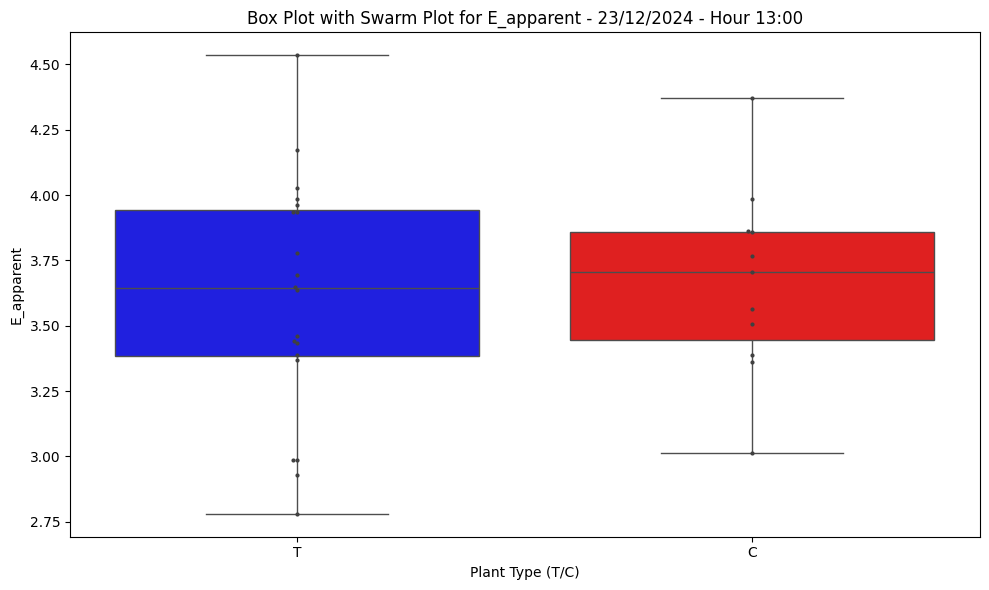

In [ ]:
# @title ### Boxplot
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Filter_Porometer_Df"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Box-Plot-Porometer"

# Create output directory if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Iterate through all CSV files in the input folder
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the CSV file
            df = pd.read_csv(os.path.join(input_folder, file_path))

            # Ensure the necessary columns exist
            required_columns = ["Date", "Time", "Plant ID", "E_apparent"]
            if not all(col in df.columns for col in required_columns):
                print(f"Skipping {file_path}: Missing required columns.")
                continue

            # Extract date and filter for specific hour (e.g., 13:XX)
            date = df["Date"].iloc[0]
            df["Hour"] = df["Time"].str[:2]  # Extract hour from Time column
            df_filtered = df[df["Hour"] == "13"]

            if df_filtered.empty:
                print(f"No data for hour 13:00 in file {file_path}. Skipping...")
                continue

            # Create a box plot with swarm plot comparing T and C for E_apparent
            plt.figure(figsize=(10, 6))
            sns.boxplot(x="Plant ID", y="E_apparent", data=df_filtered, palette={"T": "blue", "C": "red"})
            sns.swarmplot(x="Plant ID", y="E_apparent", data=df_filtered, color=".25", size=3)

            # Set title and labels
            plt.title(f"Box Plot with Swarm Plot for E_apparent - {date} - Hour 13:00")
            plt.xlabel("Plant Type (T/C)")
            plt.ylabel("E_apparent")
            plt.tight_layout()

            # Save the plot to the output folder
            output_file_name = f"{date}_hour_13_boxplot_swarm.png"
            plt.savefig(os.path.join(output_folder, output_file_name), bbox_inches="tight")
            plt.close()

            print(f"Box plot with swarm plot created and saved for {file_path}.")

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

print(f"All box plots have been created and saved in {output_folder}.")


### First we will create histograms. After getting the histograms - we want to run the T test for the porometer values to see if it is normally distributed.

In [ ]:
# @title ###histograms
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Filter_Porometer_Df"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Histograms"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Iterate through all CSV files in the input folder
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the CSV file
            df = pd.read_csv(os.path.join(input_folder, file_path))

            # Ensure the necessary columns exist
            if "E_apparent" not in df.columns or "Plant ID" not in df.columns:
                print(f"Skipping {file_path}: Missing required columns.")
                continue

            # Create histogram for E_apparent, grouped by Plant ID (T/C)
            plt.figure(figsize=(10, 6))
            sns.histplot(data=df, x="E_apparent", hue="Plant ID", kde=True, palette={"T": "blue", "C": "red"}, bins=30)

            # Set title and labels
            plt.title(f"Histogram of E_apparent - {file_path}")
            plt.xlabel("E_apparent")
            plt.ylabel("Frequency")
            plt.tight_layout()

            # Save the plot to the output folder
            output_file_name = f"{os.path.splitext(file_path)[0]}_histogram.png"
            plt.savefig(os.path.join(output_folder, output_file_name), bbox_inches="tight")
            plt.close()

            print(f"Histogram created and saved for {file_path}.")

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

print(f"All histograms have been created and saved in {output_folder}.")


Histogram created and saved for 24122024_C_T1_T4.csv.
Histogram created and saved for 23122024_C_T1_T4.csv.
Histogram created and saved for 25122024_C_T1_T4.csv.
Histogram created and saved for 07012025_C_T2_T4.csv.
Histogram created and saved for 08012025_C_T2_T4.csv.
Histogram created and saved for 09012025_C_T2_T4.csv.
All histograms have been created and saved in /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Histograms.


To ensure that there are no significant differences within each group, so that the effect of water stress is the primary factor contributing to the differences between the groups.

In [ ]:
# @title ### Normality and Variance Tests for T and C Groups
import os
import pandas as pd
from scipy.stats import shapiro, levene, bartlett
import numpy as np

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Filter_Porometer_Df"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Statistical_Tests"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Create results list to store variance test results
results = []

# Iterate through all CSV files in the input folder
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the CSV file
            df = pd.read_csv(os.path.join(input_folder, file_path))

            # Ensure the necessary columns exist
            if "E_apparent" not in df.columns or "Plant ID" not in df.columns:
                print(f"Skipping {file_path}: Missing required columns.")
                continue

            # Filter data for each group (T and C)
            group_T = df[df["Plant ID"] == "T"]["E_apparent"].dropna()
            group_C = df[df["Plant ID"] == "C"]["E_apparent"].dropna()

            # Check if there are enough data points
            if len(group_T) < 3 or len(group_C) < 3:
                print(f"Skipping {file_path}: Not enough data points for statistical tests.")
                continue

            # Perform Shapiro-Wilk normality test for each group
            p_value_T = shapiro(group_T)[1]
            p_value_C = shapiro(group_C)[1]

            print(f"{file_path}: Normality test (T) - p-value = {p_value_T:.4f}")
            print(f"{file_path}: Normality test (C) - p-value = {p_value_C:.4f}")

            # Choose variance test based on normality results
            if p_value_T > 0.05 and p_value_C > 0.05:
                test_name = "Bartlett"
                var_test_stat, var_p_value = bartlett(group_T, group_C)
            else:
                test_name = "Levene"
                var_test_stat, var_p_value = levene(group_T, group_C)

            print(f"{file_path}: {test_name}'s test - p-value = {var_p_value:.4f}")

            # Store results
            results.append({
                "File": file_path,
                "Test Used": test_name,
                "Normality (T)": f"{p_value_T:.4f}",
                "Normality (C)": f"{p_value_C:.4f}",
                "Variance Test p-value": f"{var_p_value:.4f}",
                "Interpretation": "Different Variance" if var_p_value < 0.05 else "Equal Variance"
            })

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

# Save results to CSV
results_df = pd.DataFrame(results)
results_df.to_csv(os.path.join(output_folder, "Variance_Test_Results.csv"), index=False)

print(f"\n✅ Variance test results saved to {output_folder}/Variance_Test_Results.csv")


24122024_C_T1_T4.csv: Normality test (T) - p-value = 0.8816
24122024_C_T1_T4.csv: Normality test (C) - p-value = 0.5011
24122024_C_T1_T4.csv: Bartlett's test - p-value = 0.5105
23122024_C_T1_T4.csv: Normality test (T) - p-value = 0.7227
23122024_C_T1_T4.csv: Normality test (C) - p-value = 0.9866
23122024_C_T1_T4.csv: Bartlett's test - p-value = 0.4240
25122024_C_T1_T4.csv: Normality test (T) - p-value = 0.0030
25122024_C_T1_T4.csv: Normality test (C) - p-value = 0.8334
25122024_C_T1_T4.csv: Levene's test - p-value = 0.0931
07012025_C_T2_T4.csv: Normality test (T) - p-value = 0.5027
07012025_C_T2_T4.csv: Normality test (C) - p-value = 0.8064
07012025_C_T2_T4.csv: Bartlett's test - p-value = 0.7753
08012025_C_T2_T4.csv: Normality test (T) - p-value = 0.2965
08012025_C_T2_T4.csv: Normality test (C) - p-value = 0.4105
08012025_C_T2_T4.csv: Bartlett's test - p-value = 0.1674
09012025_C_T2_T4.csv: Normality test (T) - p-value = 0.3473
09012025_C_T2_T4.csv: Normality test (C) - p-value = 0.19

Any data that does not follow a normal distribution will undergo a positive transformation

In [ ]:
# @title ### Testing for normality
import os
import pandas as pd
from scipy.stats import shapiro, boxcox
import numpy as np

# Path to the folder containing the filtered data
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Filter_Porometer_Df"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Transformed_Data"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Iterate through all CSV files in the input folder
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the CSV file
            df = pd.read_csv(os.path.join(input_folder, file_path))

            # Ensure the necessary column exists
            if "E_apparent" not in df.columns:
                print(f"Skipping {file_path}: Missing 'E_apparent' column.")
                continue

            # Extract the E_apparent column and drop NaN values
            e_apparent_data = df["E_apparent"].dropna()

            # Check if there are enough data points for the test
            if len(e_apparent_data) < 3:
                print(f"Skipping {file_path}: Not enough data points for normality test.")
                continue

            # Perform Shapiro-Wilk test for normality
            stat, p_value = shapiro(e_apparent_data)

            if p_value > 0.05:
                print(f"{file_path}: Data is normally distributed (p-value = {p_value:.4f}).")
            else:
                print(f"{file_path}: Data is NOT normally distributed (p-value = {p_value:.4f}). Applying transformation...")

                # Apply Box-Cox transformation (requires positive values)
                if (e_apparent_data <= 0).any():
                    print(f"{file_path}: Contains non-positive values. Applying log transformation instead.")
                    transformed_data = np.log1p(e_apparent_data)  # log(1 + x) to handle zeros
                else:
                    transformed_data, _ = boxcox(e_apparent_data)

                # Replace the original column with the transformed data
                df["E_apparent_transformed"] = transformed_data

                # Save the transformed data to a new CSV file
                output_file_name = f"{os.path.splitext(file_path)[0]}_transformed.csv"
                df.to_csv(os.path.join(output_folder, output_file_name), index=False)

                print(f"Transformed data saved for {file_path}.")

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")


24122024_C_T1_T4.csv: Data is normally distributed (p-value = 0.5251).
23122024_C_T1_T4.csv: Data is normally distributed (p-value = 0.7137).
25122024_C_T1_T4.csv: Data is NOT normally distributed (p-value = 0.0087). Applying transformation...
Transformed data saved for 25122024_C_T1_T4.csv.
07012025_C_T2_T4.csv: Data is normally distributed (p-value = 0.2556).
08012025_C_T2_T4.csv: Data is normally distributed (p-value = 0.1181).
09012025_C_T2_T4.csv: Data is NOT normally distributed (p-value = 0.0006). Applying transformation...
Transformed data saved for 09012025_C_T2_T4.csv.


In [ ]:
# @title ### Runing T-test
import os
import pandas as pd
from scipy.stats import ttest_ind

# הגדרת הנתיב לתיקייה עם הקבצים
folder_path = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Filter_Porometer_Df"

# רשימת קבצים בתיקייה
files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# מילון לאחסון תוצאות מבחן t
t_test_results = {}

# לולאה על כל הקבצים וביצוע מבחן t
for file in files:
    file_path = os.path.join(folder_path, file)

    # קריאת הטבלה
    df = pd.read_csv(file_path)

    # בדיקה שהעמודות הדרושות קיימות
    if 'Plant ID' in df.columns and 'E_apparent' in df.columns:
        # חלוקה לקבוצות T ו-C
        group_t = pd.to_numeric(df[df['Plant ID'] == 'T']['E_apparent'], errors='coerce').dropna()
        group_c = pd.to_numeric(df[df['Plant ID'] == 'C']['E_apparent'], errors='coerce').dropna()

        # ביצוע מבחן t (בהנחת נורמליות ושוויון שונות)
        if len(group_t) > 1 and len(group_c) > 1:
            t_stat, p_value = ttest_ind(group_t, group_c, equal_var=True)  # מניחים שוויון שונות
            t_test_results[file] = {
                "T-statistic": t_stat,
                "p-value": p_value,
            }
        else:
            t_test_results[file] = {"Error": "Not enough data in one or both groups"}
    else:
        t_test_results[file] = {"Error": "Required columns not found"}

# הדפסת התוצאות
for file, result in t_test_results.items():
    print(f"File: {file}")
    if "Error" in result:
        print(f"  Error: {result['Error']}")
    else:
        print(f"  T-statistic: {result['T-statistic']}")
        print(f"  p-value: {result['p-value']}")


File: 25122024_C_T1_T4.csv
  T-statistic: -6.057890119559363
  p-value: 9.180743660233218e-07
File: 24122024_C_T1_T4.csv
  T-statistic: -2.5532907424238758
  p-value: 0.015327493420475938
File: 23122024_C_T1_T4.csv
  T-statistic: -0.4121759767086792
  p-value: 0.6832414740679601
File: 07012025_C_T2_T4.csv
  T-statistic: 9.2330601688511
  p-value: 3.0050822377103626e-08
File: 08012025_C_T2_T4.csv
  T-statistic: 2.165630670108959
  p-value: 0.04401425873420663
File: 09012025_C_T2_T4.csv
  T-statistic: -19.09635573198995
  p-value: 2.1364651261893668e-13


## Thermal Imaging

In [ ]:
# @title ### Printing - Mean & Std Values for each treatment group(T & C)
print("Mean of group T:", group_t.mean())
print("Mean of group C:", group_c.mean())
print("Std of group T:", group_t.std())
print("Std of group C:", group_c.std())

Mean of group T: 22.261420559013303
Mean of group C: 22.036529609301652
Std of group T: 0.7227075153698035
Std of group C: 0.7688546550604226


In [ ]:
# @title ### Sample Size Calculation
import os
import pandas as pd

# Path to the folder containing temperature data
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"

# Iterate through all CSV files in the input folder
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the CSV file
            df = pd.read_csv(os.path.join(input_folder, file_path))

            # Ensure required column exists
            if "Value" not in df.columns:
                print(f"Skipping {file_path}: Missing 'Value' column.")
                continue

            # Count non-null values in "Value" column
            sample_size = df["Value"].dropna().shape[0]

            # Print result
            print(f"File: {file_path}, Sample Size (N): {sample_size}")

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

print("Sample size calculation complete.")



File: 09012025_1300_combined.csv, Sample Size (N): 116981
File: 23122024_1300_combined.csv, Sample Size (N): 145554
File: 25122024_1300_combined.csv, Sample Size (N): 152578
File: 24122024_1300_combined.csv, Sample Size (N): 138989
File: 08012025_1300_combined.csv, Sample Size (N): 162252
File: 07012025_1300_combined.csv, Sample Size (N): 195492
Sample size calculation complete.


In [ ]:
# @title ### BOXPLOT
import os
import pandas as pd
import matplotlib.pyplot as plt

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Get all CSV files in the input folder
files = [f for f in os.listdir(input_folder) if f.endswith(".csv")]

# Process each file and generate a histogram
for file in files:
    try:
        # Read the CSV file
        file_path = os.path.join(input_folder, file)
        df = pd.read_csv(file_path)

        # Ensure the required columns exist
        if "Treatment" not in df.columns or "Value" not in df.columns:
            print(f"Skipping {file}: Missing required columns.")
            continue

        # Generate the histogram
        plt.figure(figsize=(10, 6))
        df.boxplot(column="Value", by="Treatment", grid=False, showmeans=True, patch_artist=True)

        # Customize the plot
        plt.title(f"Temperature Distribution by Treatment: {file.replace('_1300_combined.csv', '')}")
        plt.suptitle("")  # Remove default title added by boxplot
        plt.xlabel("Treatment (T or C)")
        plt.ylabel("Temperature")

        # Save the histogram to the output folder
        output_file = os.path.join(output_folder, file.replace(".csv", "_histogram.png"))
        plt.savefig(output_file)
        plt.close()

        print(f"Histogram saved: {output_file}")

    except Exception as e:
        print(f"Error processing file {file}: {e}")


Histogram saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms/09012025_1300_combined_histogram.png
Histogram saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms/23122024_1300_combined_histogram.png
Histogram saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms/25122024_1300_combined_histogram.png
Histogram saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms/24122024_1300_combined_histogram.png
Histogram saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms/08012025_1300_combined_histogram.png
Histogram saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms/07012025_1300_combined_histogram.png


<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

In [ ]:
# @title ### Histograms
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Iterate through all CSV files in the input folder
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the CSV file
            df = pd.read_csv(os.path.join(input_folder, file_path))

            # Ensure the necessary columns exist
            if "Treatment" not in df.columns or "Value" not in df.columns:
                print(f"Skipping {file_path}: Missing required columns.")
                continue

            # Create histogram for temperature values grouped by Treatment (T/C)
            plt.figure(figsize=(10, 6))
            sns.histplot(data=df, x="Value", hue="Treatment", kde=True, palette={"T": "blue", "C": "red"}, bins=30)

            # Set title and labels
            plt.title(f"Histogram of Temperature - {file_path.replace('_1300_combined.csv', '')}")
            plt.xlabel("Temperature")
            plt.ylabel("Frequency")
            plt.tight_layout()

            # Save the plot to the output folder
            output_file_name = f"{os.path.splitext(file_path)[0]}_histogram.png"
            plt.savefig(os.path.join(output_folder, output_file_name), bbox_inches="tight")
            plt.close()

            print(f"Histogram created and saved for {file_path}.")

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

print(f"All histograms have been created and saved in {output_folder}.")


Histogram created and saved for 08012025_1300_combined.csv.
Histogram created and saved for 09012025_1300_combined.csv.
Histogram created and saved for 07012025_1300_combined.csv.
Histogram created and saved for 23122024_1300_combined.csv.
Histogram created and saved for 25122024_1300_combined.csv.
Histogram created and saved for 24122024_1300_combined.csv.
All histograms have been created and saved in /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histograms.


Option 2

In [ ]:
# @title ### 2
import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import shapiro

# Define path to the folder with files
folder_path = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Histogram-Treatment"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# List of files in the folder
files = [f for f in os.listdir(folder_path) if f.endswith('.csv') or f.endswith('.xlsx')]

# Loop through all files and check normality
for file in files:
    file_path = os.path.join(folder_path, file)

    # Read the table (CSV or Google Sheet - XLSX)
    if file.endswith('.csv'):
        df = pd.read_csv(file_path)
    elif file.endswith('.xlsx'):
        df = pd.read_excel(file_path)

    # Check if required columns exist
    if 'Treatment' in df.columns and 'Value' in df.columns:
        # Split into T and C groups
        group_t = pd.to_numeric(df[df['Treatment'] == 'T']['Value'], errors='coerce').dropna()
        group_c = pd.to_numeric(df[df['Treatment'] == 'C']['Value'], errors='coerce').dropna()

        # Check normality for each group
        print(f"File: {file}")
        if len(group_t) > 3:  # Requires a reasonable sample size for Shapiro-Wilk test
            stat_t, p_t = shapiro(group_t)
            print(f"  Group T - Shapiro-Wilk Test: Statistic={stat_t}, p-value={p_t}")
        else:
            print("  Group T - Not enough data for normality test")

        if len(group_c) > 3:
            stat_c, p_c = shapiro(group_c)
            print(f"  Group C - Shapiro-Wilk Test: Statistic={stat_c}, p-value={p_c}")
        else:
            print("  Group C - Not enough data for normality test")

        # Create and save histograms
        plt.figure(figsize=(10, 6))

        # Histogram for Group T
        plt.hist(group_t, bins=20, alpha=0.7, label='Group T', color='blue', edgecolor='black')

        # Histogram for Group C
        plt.hist(group_c, bins=20, alpha=0.7, label='Group C', color='orange', edgecolor='black')

        plt.title(f"Histogram for {file}")
        plt.xlabel("Value")
        plt.ylabel("Frequency")
        plt.legend()

        # Save the histogram to the output folder
        output_path = os.path.join(output_folder, f"{file}_histogram.png")
        plt.savefig(output_path)
        plt.close()


File: 09012025_1300_combined.csv
  Group T - Shapiro-Wilk Test: Statistic=0.8346984942985425, p-value=1.0337477160290626e-117
  Group C - Shapiro-Wilk Test: Statistic=0.812908549298836, p-value=2.0378533178939277e-112


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68916.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 48065.
  res = hypotest_fun_out(*samples, **kwds)


File: 23122024_1300_combined.csv
  Group T - Shapiro-Wilk Test: Statistic=0.9202649670568914, p-value=6.908048064798492e-105
  Group C - Shapiro-Wilk Test: Statistic=0.9373896720094895, p-value=4.1063478348547705e-86


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 94111.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 51443.
  res = hypotest_fun_out(*samples, **kwds)


File: 25122024_1300_combined.csv
  Group T - Shapiro-Wilk Test: Statistic=0.8162732453677324, p-value=6.355977940761148e-129
  Group C - Shapiro-Wilk Test: Statistic=0.9514634625706628, p-value=1.1607236947483435e-81


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 97162.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 55416.
  res = hypotest_fun_out(*samples, **kwds)


File: 24122024_1300_combined.csv
  Group T - Shapiro-Wilk Test: Statistic=0.9812913462356049, p-value=4.155870845121685e-70
  Group C - Shapiro-Wilk Test: Statistic=0.950875221191616, p-value=1.0962274240728415e-77


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 94232.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 44757.
  res = hypotest_fun_out(*samples, **kwds)


File: 08012025_1300_combined.csv
  Group T - Shapiro-Wilk Test: Statistic=0.8615709008912997, p-value=4.892843910413673e-123
  Group C - Shapiro-Wilk Test: Statistic=0.8950544200818665, p-value=3.2735851679249936e-100


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 107494.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 54758.
  res = hypotest_fun_out(*samples, **kwds)


File: 07012025_1300_combined.csv
  Group T - Shapiro-Wilk Test: Statistic=0.978141625444287, p-value=2.676361516289328e-80
  Group C - Shapiro-Wilk Test: Statistic=0.8735490222010638, p-value=2.5765037102838077e-105


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 140104.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 55388.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
# @title ### Normality and Variance Tests for T and C Groups
import os
import pandas as pd
import numpy as np
from scipy.stats import normaltest, bartlett, levene

# Path to the folder containing temperature data
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"

# Iterate through all CSV files in the input folder
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the CSV file
            df = pd.read_csv(os.path.join(input_folder, file_path))

            # Ensure required columns exist
            if "Treatment" not in df.columns or "Value" not in df.columns:
                print(f"Skipping {file_path}: Required columns not found.")
                continue

            # Separate data by Treatment (T and C)
            T_values = df[df["Treatment"] == "T"]["Value"].dropna()
            C_values = df[df["Treatment"] == "C"]["Value"].dropna()

            # Check if there are enough data points for testing
            if len(T_values) < 3 or len(C_values) < 3:
                print(f"Skipping {file_path}: Not enough data points for testing.")
                continue

            # Take a sample if dataset is too large (limit to 1000)
            sample_size = 1000
            if len(T_values) > sample_size:
                T_values = np.random.choice(T_values, size=sample_size, replace=False)
            if len(C_values) > sample_size:
                C_values = np.random.choice(C_values, size=sample_size, replace=False)

            # Perform normality test for each group using D’Agostino and Pearson's test
            T_stat, T_p = normaltest(T_values)
            C_stat, C_p = normaltest(C_values)

            # Determine normality
            normality_T = T_p > 0.05
            normality_C = C_p > 0.05

            # Select variance test based on normality
            if normality_T and normality_C:
                # If both groups are normally distributed, use Bartlett's test
                var_test_stat, var_p_value = bartlett(T_values, C_values)
                var_test_name = "Bartlett's Test"
            else:
                # If at least one group is not normal, use Levene's test
                var_test_stat, var_p_value = levene(T_values, C_values)
                var_test_name = "Levene's Test"

            # Print results
            print(f"File: {file_path}")
            print(f"  Normality test (T) - p-value = {T_p:.6f}")
            print(f"  Normality test (C) - p-value = {C_p:.6f}")
            print(f"  {var_test_name} - p-value = {var_p_value:.6f}")
            print("-" * 50)

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")


File: 09012025_1300_combined.csv
  Normality test (T) - p-value = 0.000000
  Normality test (C) - p-value = 0.000000
  Levene's Test - p-value = 0.589998
--------------------------------------------------
File: 23122024_1300_combined.csv
  Normality test (T) - p-value = 0.000000
  Normality test (C) - p-value = 0.000000
  Levene's Test - p-value = 0.317264
--------------------------------------------------
File: 25122024_1300_combined.csv
  Normality test (T) - p-value = 0.000000
  Normality test (C) - p-value = 0.000000
  Levene's Test - p-value = 0.006123
--------------------------------------------------
File: 24122024_1300_combined.csv
  Normality test (T) - p-value = 0.000702
  Normality test (C) - p-value = 0.000009
  Levene's Test - p-value = 0.000000
--------------------------------------------------
File: 08012025_1300_combined.csv
  Normality test (T) - p-value = 0.000000
  Normality test (C) - p-value = 0.000000
  Levene's Test - p-value = 0.550350
--------------------------

In [ ]:
# @title ###  T test
import os
import pandas as pd

# Define the path to the folder containing the files
folder_path = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"

# List of files in the folder
files = [f for f in os.listdir(folder_path) if f.endswith('.csv') or f.endswith('.xlsx')]

# Loop through all files and count samples by Treatment
for file in files:
    file_path = os.path.join(folder_path, file)

    # Read the table (CSV or Google Sheet - XLSX)
    if file.endswith('.csv'):
        df = pd.read_csv(file_path)
    elif file.endswith('.xlsx'):
        df = pd.read_excel(file_path)

    # Check if required columns exist
    if 'Treatment' in df.columns and 'Value' in df.columns:
        # Count samples for each Treatment
        counts = df.groupby('Treatment')['Value'].count()

        # Print the results
        print(f"File: {file}")
        print(counts)
        print("-" * 40)
    else:
        print(f"File: {file} - Required columns not found")


File: 09012025_1300_combined.csv
Treatment
C    48065
T    68916
Name: Value, dtype: int64
----------------------------------------
File: 23122024_1300_combined.csv
Treatment
C    51443
T    94111
Name: Value, dtype: int64
----------------------------------------
File: 25122024_1300_combined.csv
Treatment
C    55416
T    97162
Name: Value, dtype: int64
----------------------------------------
File: 24122024_1300_combined.csv
Treatment
C    44757
T    94232
Name: Value, dtype: int64
----------------------------------------
File: 08012025_1300_combined.csv
Treatment
C     54758
T    107494
Name: Value, dtype: int64
----------------------------------------
File: 07012025_1300_combined.csv
Treatment
C     55388
T    140104
Name: Value, dtype: int64
----------------------------------------


In [ ]:
# @title ###  T test
import os
import pandas as pd
from scipy.stats import ttest_ind, levene

# Define the path to the folder containing the files
folder_path = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"

# List of files in the folder
files = [f for f in os.listdir(folder_path) if f.endswith('.csv') or f.endswith('.xlsx')]

# Dictionary to store t-test results
t_test_results = {}

# Loop through all files and perform Levene's and t-tests
for file in files:
    file_path = os.path.join(folder_path, file)

    # Read the table (CSV or Google Sheet - XLSX)
    if file.endswith('.csv'):
        df = pd.read_csv(file_path)
    elif file.endswith('.xlsx'):
        df = pd.read_excel(file_path)

    # Check if required columns exist
    if 'Treatment' in df.columns and 'Value' in df.columns:
        # Split into T and C groups
        group_t = pd.to_numeric(df[df['Treatment'] == 'T']['Value'], errors='coerce').dropna()
        group_c = pd.to_numeric(df[df['Treatment'] == 'C']['Value'], errors='coerce').dropna()

        # Check for equal variance using Levene's test
        if len(group_t) > 1 and len(group_c) > 1:
            levene_stat, levene_p = levene(group_t, group_c)
            equal_var = levene_p > 0.05  # If p-value > 0.05, assume equal variance

            # Perform t-test
            t_stat, p_value = ttest_ind(group_t, group_c, equal_var=equal_var)

            # Store results
            t_test_results[file] = {
                "Levene Statistic": levene_stat,
                "Levene p-value": levene_p,
                "Equal Variance Assumed": equal_var,
                "T-statistic": t_stat,
                "p-value": p_value,
            }
        else:
            t_test_results[file] = {"Error": "Not enough data in one or both groups"}
    else:
        t_test_results[file] = {"Error": "Required columns not found"}

# Print results with p-value in scientific format
for file, result in t_test_results.items():
    print(f"File: {file}")
    if "Error" in result:
        print(f"  Error: {result['Error']}")
    else:
        print(f"  Levene Statistic: {result['Levene Statistic']:.6f}")
        print(f"  Levene p-value: {result['Levene p-value']:.20f}")
        print(f"  Equal Variance Assumed: {result['Equal Variance Assumed']}")
        print(f"  T-statistic: {result['T-statistic']:.6f}")
        print(f"  p-value: {result['p-value']:.20f}")


File: 09012025_1300_combined.csv
  Levene Statistic: 4.651333
  Levene p-value: 0.03103147618318767911
  Equal Variance Assumed: False
  T-statistic: 274.216430
  p-value: 0.00000000000000000000
File: 23122024_1300_combined.csv
  Levene Statistic: 434.996415
  Levene p-value: 0.00000000000000000000
  Equal Variance Assumed: False
  T-statistic: 291.429484
  p-value: 0.00000000000000000000
File: 25122024_1300_combined.csv
  Levene Statistic: 314.600879
  Levene p-value: 0.00000000000000000000
  Equal Variance Assumed: False
  T-statistic: 293.833245
  p-value: 0.00000000000000000000
File: 24122024_1300_combined.csv
  Levene Statistic: 2446.504179
  Levene p-value: 0.00000000000000000000
  Equal Variance Assumed: False
  T-statistic: 119.299664
  p-value: 0.00000000000000000000
File: 08012025_1300_combined.csv
  Levene Statistic: 73.593847
  Levene p-value: 0.00000000000000000968
  Equal Variance Assumed: False
  T-statistic: 206.401662
  p-value: 0.00000000000000000000
File: 07012025_13

In [ ]:
# @title ### T-test with unequal variances and unequal sample sizes
import os
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind, levene

# Define the path to the folder containing the files
folder_path = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"

# List of files in the folder
files = [f for f in os.listdir(folder_path) if f.endswith('.csv') or f.endswith('.xlsx')]

# Dictionary to store t-test results
t_test_results = {}

# Loop through all files and perform Levene's and t-tests
for file in files:
    file_path = os.path.join(folder_path, file)

    # Read the table (CSV or Google Sheet - XLSX)
    if file.endswith('.csv'):
        df = pd.read_csv(file_path)
    elif file.endswith('.xlsx'):
        df = pd.read_excel(file_path)

    # Check if required columns exist
    if 'Treatment' in df.columns and 'Value' in df.columns:
        # Split into T and C groups
        group_t = pd.to_numeric(df[df['Treatment'] == 'T']['Value'], errors='coerce').dropna()
        group_c = pd.to_numeric(df[df['Treatment'] == 'C']['Value'], errors='coerce').dropna()

        # Check for equal variance using Levene's test
        if len(group_t) > 1 and len(group_c) > 1:
            levene_stat, levene_p = levene(group_t, group_c)
            equal_var = levene_p > 0.05  # If p-value > 0.05, assume equal variance

            # Perform t-test (Welch's t-test if variances are not equal)
            t_stat, p_value = ttest_ind(group_t, group_c, equal_var=equal_var)

            # Store results
            t_test_results[file] = {
                "Levene Statistic": levene_stat,
                "Levene p-value": levene_p,
                "Equal Variance Assumed": equal_var,
                "T-statistic": t_stat,
                "p-value": p_value,
                "Group T Size": len(group_t),
                "Group C Size": len(group_c),
            }
        else:
            t_test_results[file] = {"Error": "Not enough data in one or both groups"}
    else:
        t_test_results[file] = {"Error": "Required columns not found"}

# Print results with p-value in scientific format
for file, result in t_test_results.items():
    print(f"File: {file}")
    if "Error" in result:
        print(f"  Error: {result['Error']}")
    else:
        print(f"  Group T Size: {result['Group T Size']}")
        print(f"  Group C Size: {result['Group C Size']}")
        print(f"  Levene Statistic: {result['Levene Statistic']:.6f}")
        print(f"  T-statistic: {result['T-statistic']:.6f}")


File: 09012025_1300_combined.csv
  Group T Size: 68916
  Group C Size: 48065
  Levene Statistic: 4.651333
  T-statistic: 274.216430
File: 23122024_1300_combined.csv
  Group T Size: 94111
  Group C Size: 51443
  Levene Statistic: 434.996415
  T-statistic: 291.429484
File: 25122024_1300_combined.csv
  Group T Size: 97162
  Group C Size: 55416
  Levene Statistic: 314.600879
  T-statistic: 293.833245
File: 24122024_1300_combined.csv
  Group T Size: 94232
  Group C Size: 44757
  Levene Statistic: 2446.504179
  T-statistic: 119.299664
File: 08012025_1300_combined.csv
  Group T Size: 107494
  Group C Size: 54758
  Levene Statistic: 73.593847
  T-statistic: 206.401662
File: 07012025_1300_combined.csv
  Group T Size: 140104
  Group C Size: 55388
  Levene Statistic: 212.068739
  T-statistic: 59.262627


# **Part 4- Comparison of Porometer Data vs. Thermal Imaging**
Pearson correlation is used to measure the **linear relationship** between  
the T-statistics of the thermal imaging and Porometer data.  

A **high positive correlation** indicates that both measurements show similar trends,  
while a **low correlation** suggests differences in how each method detects water stress.

In [ ]:
# @title ## Calculate Pearson Correlation
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define T-statistics values for thermal imaging (per day)
thermal_t_stats = np.array([274.216430, 291.429484, 293.833245,
                            119.299664, 206.401662, 59.426627])

# Define T-statistics values for fluorometer (per day)
fluorometer_t_stats = np.array([-6.057890, -2.553290, -0.411276,
                                9.233066, 2.165606, -19.096536])

# Define corresponding days
days = ["23.12", "24.12", "25.12", "07.01", "08.01", "09.01"]


# Split the data into two weeks
thermal_week1 = thermal_t_stats[:3]
thermal_week2 = thermal_t_stats[3:]

fluorometer_week1 = fluorometer_t_stats[:3]
fluorometer_week2 = fluorometer_t_stats[3:]

days_week1 = days[:3]
days_week2 = days[3:]

# Calculate Pearson correlation for each week
correlation_week1 = np.corrcoef(thermal_week1, fluorometer_week1)[0, 1]
correlation_week2 = np.corrcoef(thermal_week2, fluorometer_week2)[0, 1]

# Print results
print(f"Pearson correlation (Week 1): {correlation_week1:.2f}")
print(f"Pearson correlation (Week 2): {correlation_week2:.2f}")

Pearson correlation (Week 1): 0.96
Pearson correlation (Week 2): 0.64


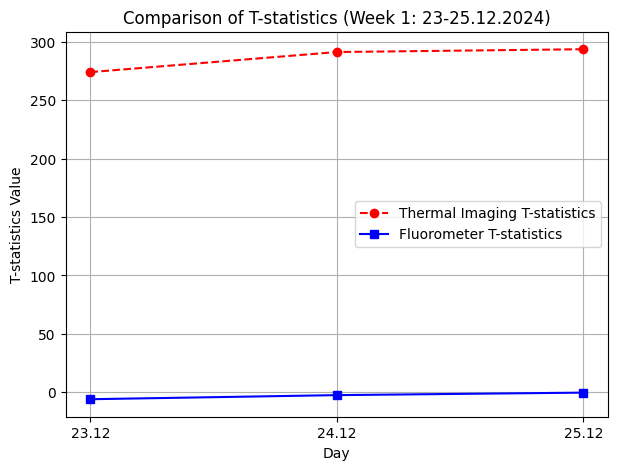

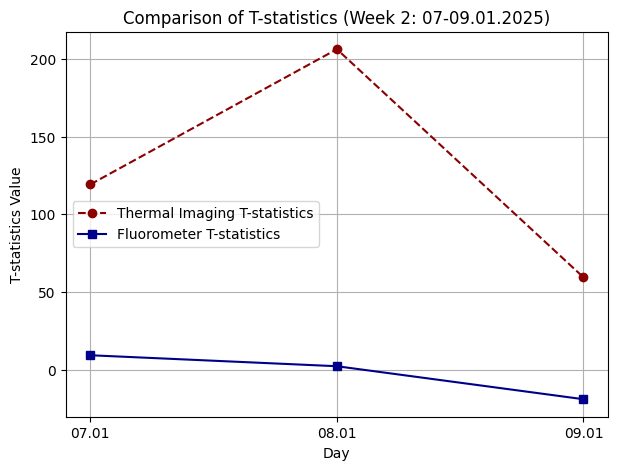

In [ ]:
# @title ## Plot Comparison of T-statistics
# Plot Week 1
plt.figure(figsize=(7,5))
plt.plot(days_week1, thermal_week1, marker='o', linestyle='--', color='red', label="Thermal Imaging T-statistics")
plt.plot(days_week1, fluorometer_week1, marker='s', linestyle='-', color='blue', label="Fluorometer T-statistics")
plt.xlabel("Day")
plt.ylabel("T-statistics Value")
plt.title("Comparison of T-statistics (Week 1: 23-25.12.2024)")
plt.legend()
plt.grid(True)
plt.show()

# Plot Week 2
plt.figure(figsize=(7,5))
plt.plot(days_week2, thermal_week2, marker='o', linestyle='--', color='darkred', label="Thermal Imaging T-statistics")
plt.plot(days_week2, fluorometer_week2, marker='s', linestyle='-', color='darkblue', label="Fluorometer T-statistics")
plt.xlabel("Day")
plt.ylabel("T-statistics Value")
plt.title("Comparison of T-statistics (Week 2: 07-09.01.2025)")
plt.legend()
plt.grid(True)
plt.show()

# ANOVA Test Attempts  
**Reasons for Test Failure:**  
1. Large number of data for temp  
2. Small sample size leading to biased outcomes


## Porometer

In [ ]:
# @title ### Running Anova test
import os
import pandas as pd
from scipy.stats import f_oneway

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Filter_Porometer_Df"
transformed_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Transformed_Data"

# Collect files for normal and transformed data
normal_files = [f for f in os.listdir(input_folder) if f.endswith(".csv")]
transformed_files = [f for f in os.listdir(transformed_folder) if f.endswith(".csv")]

# Function to perform ANOVA
def perform_anova(data, group_column, value_column):
    groups = data[group_column].unique()
    group_data = [data[data[group_column] == group][value_column].dropna() for group in groups]
    stat, p_value = f_oneway(*group_data)
    return stat, p_value

# Perform ANOVA on normal files
print("Performing ANOVA on normally distributed data:")
for file_path in normal_files:
    try:
        df = pd.read_csv(os.path.join(input_folder, file_path))
        if "Plant ID" not in df.columns or "E_apparent" not in df.columns:
            print(f"Skipping {file_path}: Missing required columns.")
            continue

        # Perform ANOVA
        stat, p_value = perform_anova(df, group_column="Plant ID", value_column="E_apparent")
        print(f"{file_path}: F-statistic = {stat:.4f}, p-value = {p_value:.4f}")
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")

# Perform ANOVA on transformed files
print("\nPerforming ANOVA on transformed data:")
for file_path in transformed_files:
    try:
        df = pd.read_csv(os.path.join(transformed_folder, file_path))
        if "Plant ID" not in df.columns or "E_apparent_transformed" not in df.columns:
            print(f"Skipping {file_path}: Missing required columns.")
            continue

        # Perform ANOVA
        stat, p_value = perform_anova(df, group_column="Plant ID", value_column="E_apparent_transformed")
        print(f"{file_path}: F-statistic = {stat:.4f}, p-value = {p_value:.4f}")
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")


Performing ANOVA on normally distributed data:
24122024_C_T1_T4.csv: F-statistic = 6.5193, p-value = 0.0153
23122024_C_T1_T4.csv: F-statistic = 0.1699, p-value = 0.6832
25122024_C_T1_T4.csv: F-statistic = 36.6980, p-value = 0.0000
07012025_C_T2_T4.csv: F-statistic = 85.2494, p-value = 0.0000
08012025_C_T2_T4.csv: F-statistic = 4.6900, p-value = 0.0440
09012025_C_T2_T4.csv: F-statistic = 364.6708, p-value = 0.0000

Performing ANOVA on transformed data:
25122024_C_T1_T4_transformed.csv: F-statistic = 30.5684, p-value = 0.0000
09012025_C_T2_T4_transformed.csv: F-statistic = 530.0259, p-value = 0.0000


This test will let us know in which groups there is a distinct difference.

In [ ]:
# @title ### Tukey HSD Test
import os
import pandas as pd
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Filter_Porometer_Df"
transformed_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Transformed_Data"
output_file = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Tukey_ANOVA_Results.csv"

# Function to perform ANOVA
def perform_anova(data, group_column, value_column):
    groups = [data[data[group_column] == group][value_column].dropna() for group in data[group_column].unique()]
    stat, p_value = f_oneway(*groups)
    return stat, p_value

# Function to perform Tukey HSD test
def perform_tukey(data, group_column, value_column):
    tukey = pairwise_tukeyhsd(endog=data[value_column], groups=data[group_column], alpha=0.05)
    tukey_df = pd.DataFrame(tukey.summary().data[1:], columns=tukey.summary().data[0])
    return tukey_df

# Combine results into a single DataFrame
results = []

# Process normally distributed data
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            df = pd.read_csv(os.path.join(input_folder, file_path))
            if "Plant ID" not in df.columns or "E_apparent" not in df.columns:
                print(f"Skipping {file_path}: Missing required columns.")
                continue

            # Perform ANOVA
            f_stat, p_value_anova = perform_anova(df, group_column="Plant ID", value_column="E_apparent")

            # Perform Tukey HSD
            tukey_results = perform_tukey(df, group_column="Plant ID", value_column="E_apparent")
            tukey_results["Day"] = os.path.splitext(file_path)[0]
            tukey_results["F-Statistic"] = f_stat
            tukey_results["ANOVA P-Value"] = p_value_anova

            # Add results to the main list
            results.append(tukey_results)

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

# Process transformed data
for file_path in os.listdir(transformed_folder):
    if file_path.endswith(".csv"):
        try:
            df = pd.read_csv(os.path.join(transformed_folder, file_path))
            if "Plant ID" not in df.columns or "E_apparent_transformed" not in df.columns:
                print(f"Skipping {file_path}: Missing required columns.")
                continue

            # Perform ANOVA
            f_stat, p_value_anova = perform_anova(df, group_column="Plant ID", value_column="E_apparent_transformed")

            # Perform Tukey HSD
            tukey_results = perform_tukey(df, group_column="Plant ID", value_column="E_apparent_transformed")
            tukey_results["Day"] = os.path.splitext(file_path)[0]
            tukey_results["F-Statistic"] = f_stat
            tukey_results["ANOVA P-Value"] = p_value_anova

            # Add results to the main list
            results.append(tukey_results)

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

# Combine all results into a single DataFrame and save to CSV
if results:
    final_df = pd.concat(results, ignore_index=True)
    final_df.to_csv(output_file, index=False)
    print(f"Results saved to {output_file}")
else:
    print("No results to save.")



Results saved to /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Porometer/Tukey_ANOVA_Results.csv


In [ ]:
# @title ### Testing for normality and applying a transformation
import os
import pandas as pd
import numpy as np
from scipy.stats import kstest, boxcox
import matplotlib.pyplot as plt

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"
output_folder_transformed = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Transformed_Data"
output_folder_histograms = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Normality_Histograms"

# Create output folders if they don't exist
os.makedirs(output_folder_transformed, exist_ok=True)
os.makedirs(output_folder_histograms, exist_ok=True)

# Iterate through all CSV files in the input folder
for file_path in os.listdir(input_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the CSV file
            df = pd.read_csv(os.path.join(input_folder, file_path))

            # Ensure the necessary columns exist
            if "Value" not in df.columns or "Treatment" not in df.columns:
                print(f"Skipping {file_path}: Missing required columns.")
                continue

            # Separate data by treatment
            for treatment in df["Treatment"].unique():
                treatment_data = df[df["Treatment"] == treatment]["Value"]

                # Remove NaN values for normality test
                treatment_data = treatment_data.dropna()

                # Perform Kolmogorov-Smirnov test for normality
                stat, p_value = kstest(treatment_data, 'norm')

                print(f"{file_path} - Treatment: {treatment} - Kolmogorov-Smirnov p-value: {p_value:.4f}")

                # Check if data is normally distributed (p > 0.05)
                if p_value > 0.05:
                    print(f"{file_path} - Treatment: {treatment} is normally distributed.")
                    transformed_data = treatment_data  # No transformation needed
                else:
                    print(f"{file_path} - Treatment: {treatment} is NOT normally distributed. Performing transformation...")

                    # Perform Box-Cox transformation (only for positive values)
                    if all(treatment_data > 0):
                        transformed_data, _ = boxcox(treatment_data)
                    else:
                        # If Box-Cox is not applicable, use log transformation (add a small constant to avoid log(0))
                        transformed_data = np.log(treatment_data + 1e-6)

                # Save transformed data to a new DataFrame
                transformed_df = pd.DataFrame({
                    "Value": transformed_data,
                    "Treatment": [treatment] * len(transformed_data)
                })

                # Save the transformed data to a new CSV file
                output_file_name = f"{os.path.splitext(file_path)[0]}_{treatment}_transformed.csv"
                transformed_df.to_csv(os.path.join(output_folder_transformed, output_file_name), index=False)

                # Plot histogram of original and transformed data for comparison
                plt.figure(figsize=(12, 6))

                # Original data histogram
                plt.subplot(1, 2, 1)
                plt.hist(treatment_data, bins=30, color="blue", alpha=0.7)
                plt.title(f"Original Data - {file_path} ({treatment})")
                plt.xlabel("Value")
                plt.ylabel("Frequency")

                # Transformed data histogram
                plt.subplot(1, 2, 2)
                plt.hist(transformed_data, bins=30, color="green", alpha=0.7)
                plt.title(f"Transformed Data - {file_path} ({treatment})")
                plt.xlabel("Value")
                plt.ylabel("Frequency")

                # Save the histogram plot
                histogram_file_name = f"{os.path.splitext(file_path)[0]}_{treatment}_histogram.png"
                plt.tight_layout()
                plt.savefig(os.path.join(output_folder_histograms, histogram_file_name))
                plt.close()

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

print("All files have been processed.")


08012025_1300_combined.csv - Treatment: T - Kolmogorov-Smirnov p-value: 0.0000
08012025_1300_combined.csv - Treatment: T is NOT normally distributed. Performing transformation...
08012025_1300_combined.csv - Treatment: C - Kolmogorov-Smirnov p-value: 0.0000
08012025_1300_combined.csv - Treatment: C is NOT normally distributed. Performing transformation...
09012025_1300_combined.csv - Treatment: T - Kolmogorov-Smirnov p-value: 0.0000
09012025_1300_combined.csv - Treatment: T is NOT normally distributed. Performing transformation...
09012025_1300_combined.csv - Treatment: C - Kolmogorov-Smirnov p-value: 0.0000
09012025_1300_combined.csv - Treatment: C is NOT normally distributed. Performing transformation...
07012025_1300_combined.csv - Treatment: T - Kolmogorov-Smirnov p-value: 0.0000
07012025_1300_combined.csv - Treatment: T is NOT normally distributed. Performing transformation...
07012025_1300_combined.csv - Treatment: C - Kolmogorov-Smirnov p-value: 0.0000
07012025_1300_combined.csv

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 107494.
  res = hypotest_fun_out(*samples, **kwds)


08012025_1300_combined_T_transformed.csv - Treatment: T - Shapiro-Wilk p-value: 0.0000
08012025_1300_combined_T_transformed.csv - Treatment: T is still NOT normally distributed.
Error processing file 08012025_1300_combined_T_transformed.csv: name 'stats' is not defined
08012025_1300_combined_C_transformed.csv - Treatment: C - Shapiro-Wilk p-value: 0.0000
08012025_1300_combined_C_transformed.csv - Treatment: C is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 54758.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 08012025_1300_combined_C_transformed.csv: name 'stats' is not defined
09012025_1300_combined_T_transformed.csv - Treatment: T - Shapiro-Wilk p-value: 0.0000
09012025_1300_combined_T_transformed.csv - Treatment: T is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68916.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 09012025_1300_combined_T_transformed.csv: name 'stats' is not defined
09012025_1300_combined_C_transformed.csv - Treatment: C - Shapiro-Wilk p-value: 1.0000
09012025_1300_combined_C_transformed.csv - Treatment: C is now normally distributed.
Error processing file 09012025_1300_combined_C_transformed.csv: name 'stats' is not defined


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 48065.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 140104.
  res = hypotest_fun_out(*samples, **kwds)


07012025_1300_combined_T_transformed.csv - Treatment: T - Shapiro-Wilk p-value: 0.0000
07012025_1300_combined_T_transformed.csv - Treatment: T is still NOT normally distributed.
Error processing file 07012025_1300_combined_T_transformed.csv: name 'stats' is not defined
07012025_1300_combined_C_transformed.csv - Treatment: C - Shapiro-Wilk p-value: 0.0000
07012025_1300_combined_C_transformed.csv - Treatment: C is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 55388.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 07012025_1300_combined_C_transformed.csv: name 'stats' is not defined
23122024_1300_combined_C_transformed.csv - Treatment: C - Shapiro-Wilk p-value: 0.0000
23122024_1300_combined_C_transformed.csv - Treatment: C is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 51443.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 23122024_1300_combined_C_transformed.csv: name 'stats' is not defined
23122024_1300_combined_T_transformed.csv - Treatment: T - Shapiro-Wilk p-value: 0.0000
23122024_1300_combined_T_transformed.csv - Treatment: T is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 94111.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 23122024_1300_combined_T_transformed.csv: name 'stats' is not defined
25122024_1300_combined_C_transformed.csv - Treatment: C - Shapiro-Wilk p-value: 0.0000
25122024_1300_combined_C_transformed.csv - Treatment: C is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 55416.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 25122024_1300_combined_C_transformed.csv: name 'stats' is not defined
25122024_1300_combined_T_transformed.csv - Treatment: T - Shapiro-Wilk p-value: 0.0000
25122024_1300_combined_T_transformed.csv - Treatment: T is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 97162.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 25122024_1300_combined_T_transformed.csv: name 'stats' is not defined
24122024_1300_combined_C_transformed.csv - Treatment: C - Shapiro-Wilk p-value: 0.0000
24122024_1300_combined_C_transformed.csv - Treatment: C is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 44757.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 24122024_1300_combined_C_transformed.csv: name 'stats' is not defined
24122024_1300_combined_T_transformed.csv - Treatment: T - Shapiro-Wilk p-value: 0.0000
24122024_1300_combined_T_transformed.csv - Treatment: T is still NOT normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 94232.
  res = hypotest_fun_out(*samples, **kwds)


Error processing file 24122024_1300_combined_T_transformed.csv: name 'stats' is not defined
Validation completed. Check the histograms and QQ plots for results.


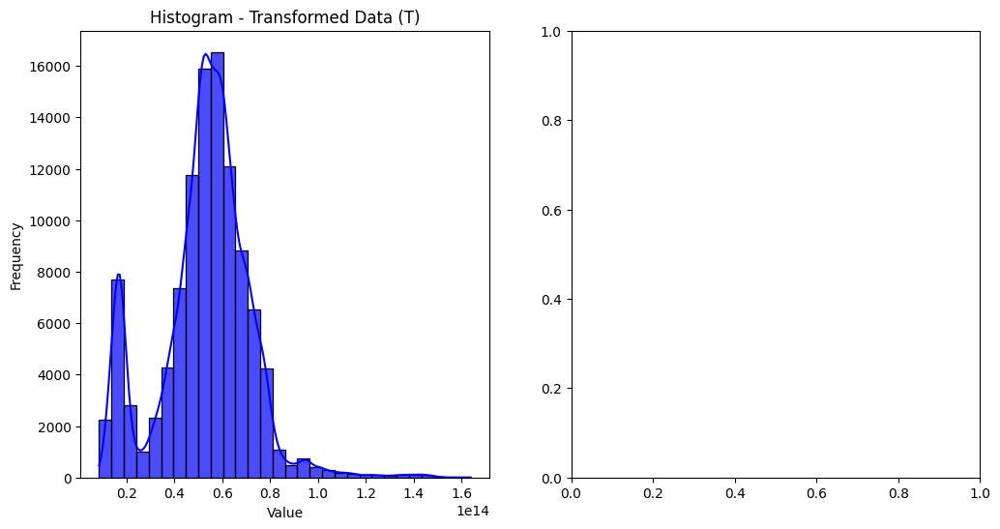

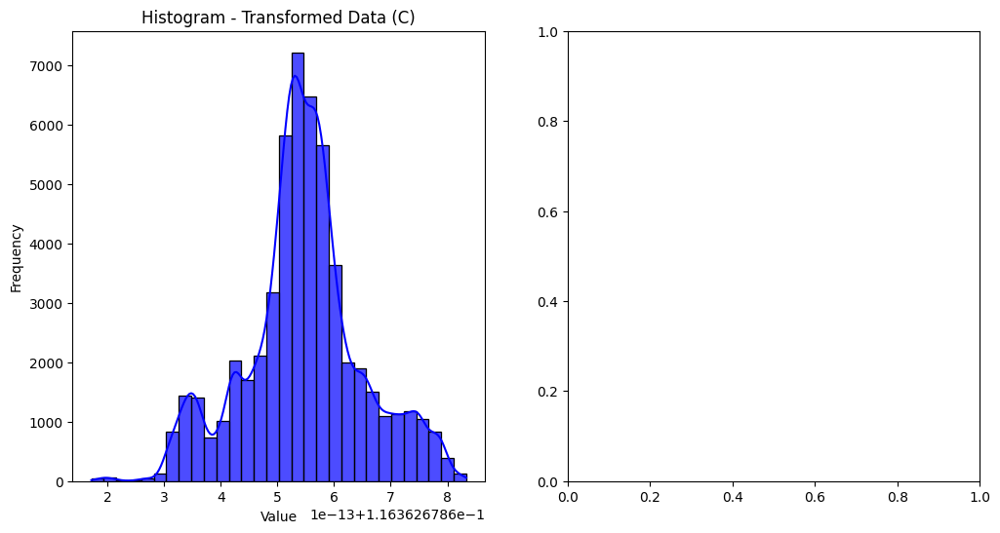

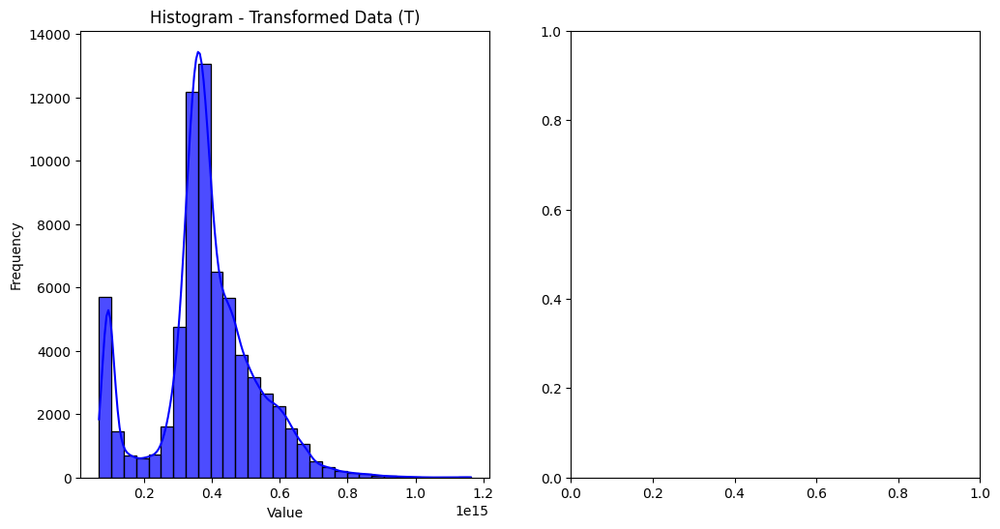

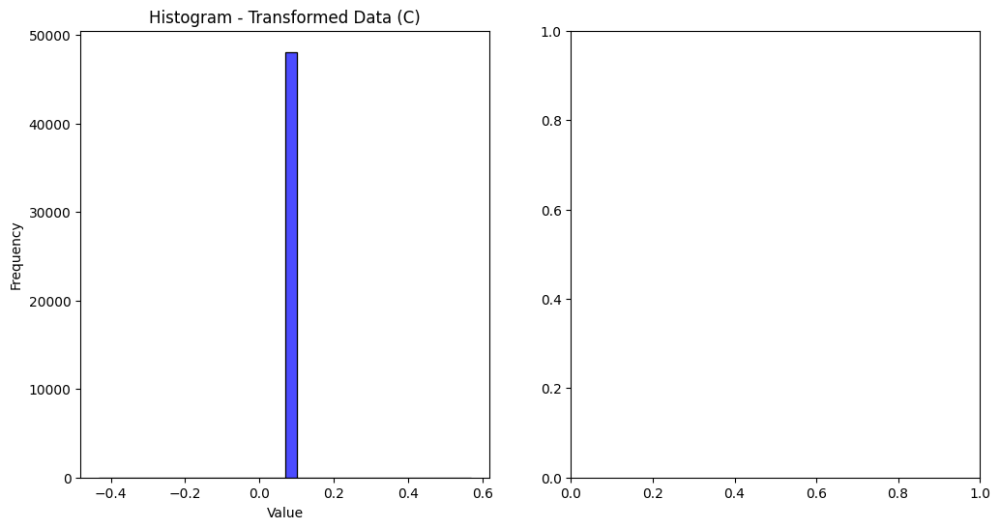

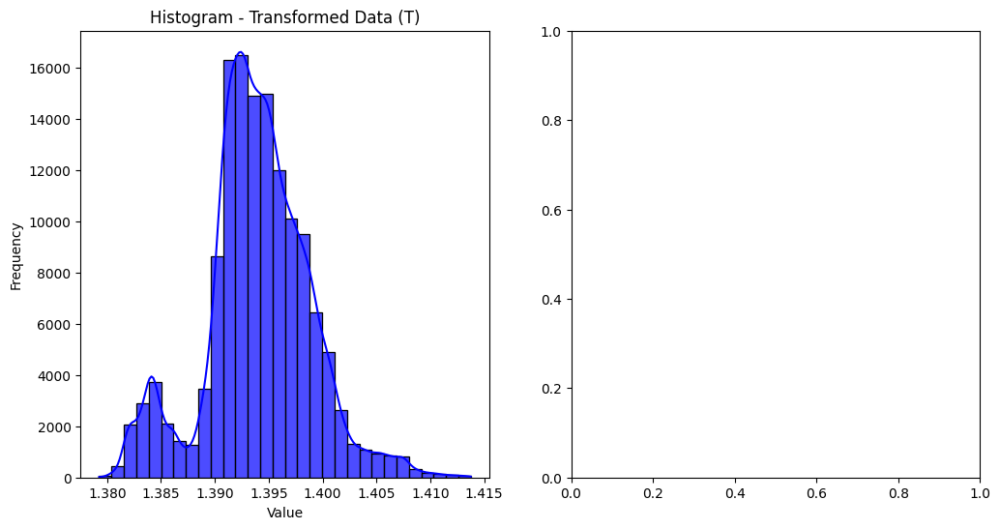

...

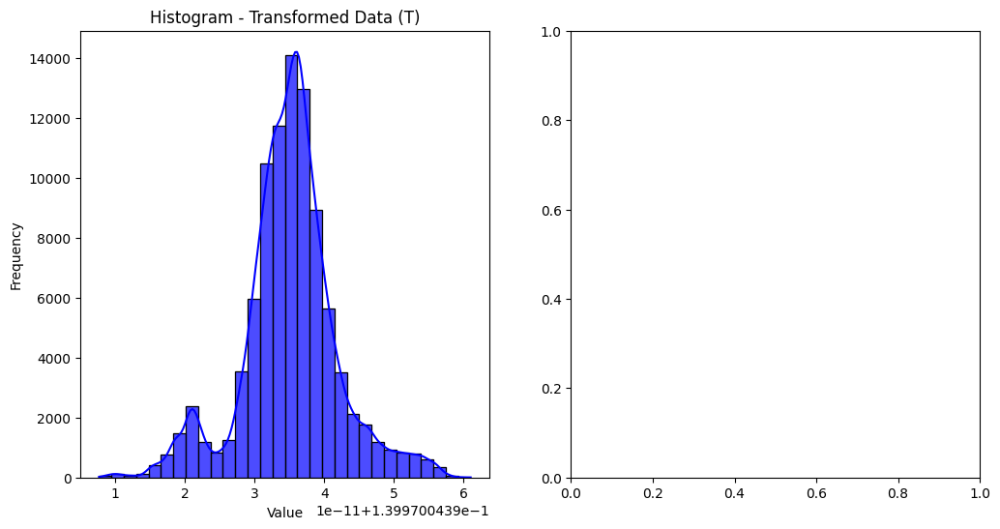

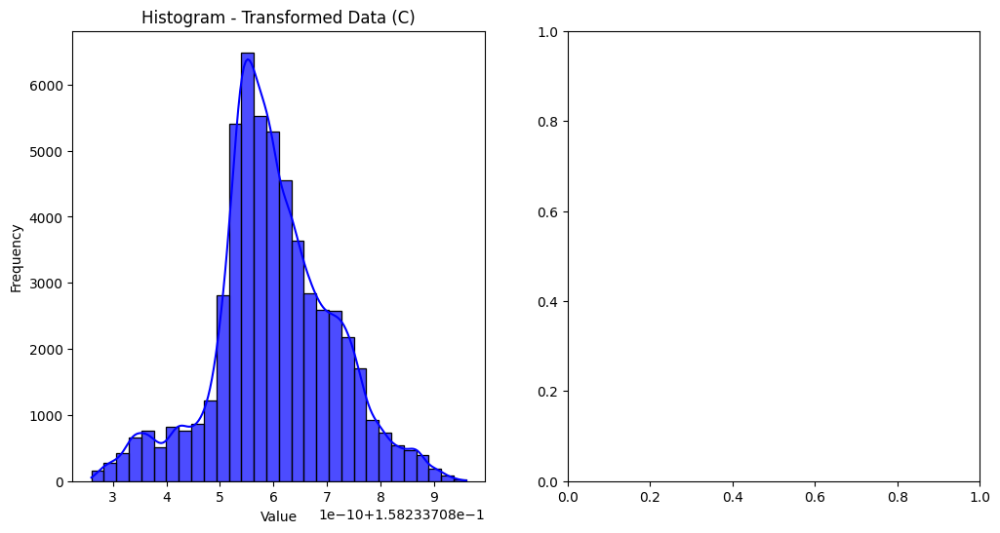

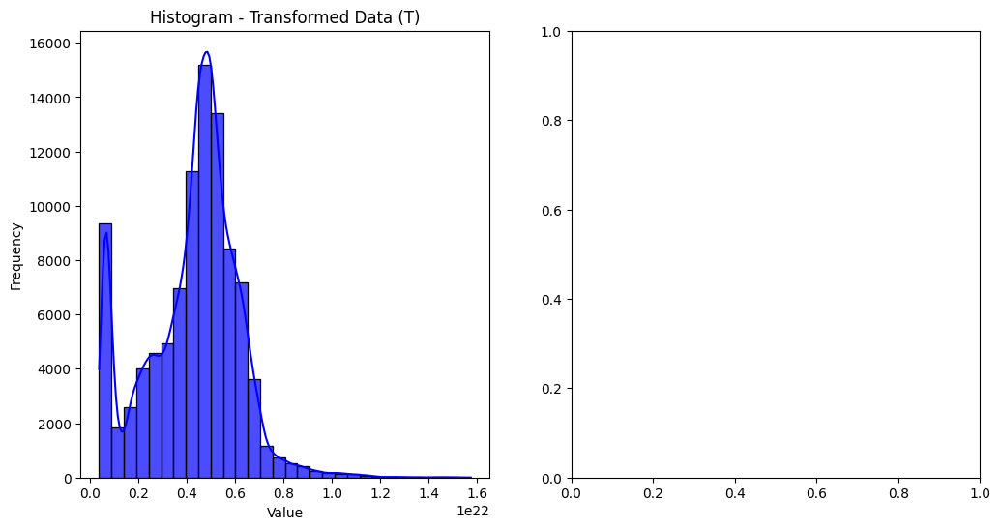

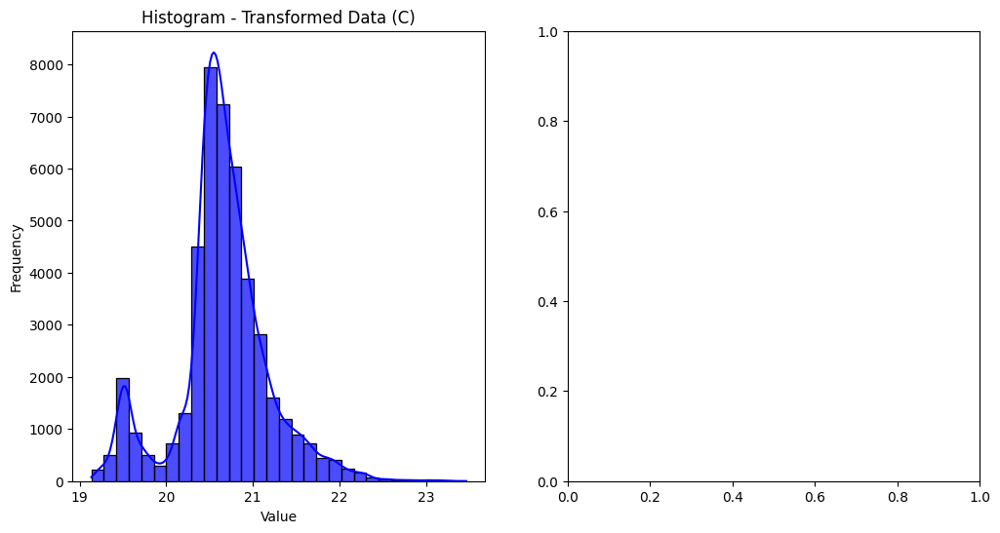

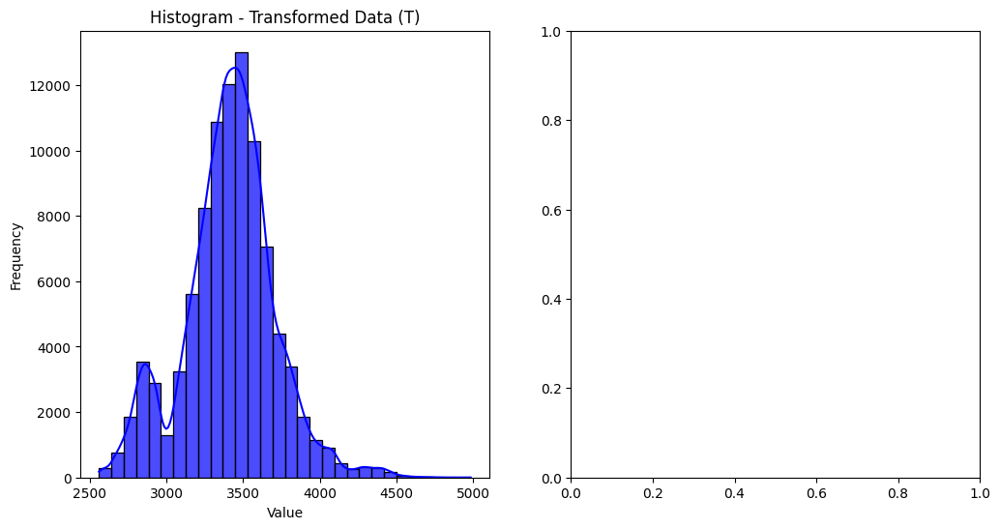

In [ ]:
# @title ### Validating the transformation
import os
import pandas as pd
import numpy as np
from scipy.stats import shapiro, kstest
import matplotlib.pyplot as plt
import seaborn as sns

# Paths
transformed_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Transformed_Data"
histogram_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Transformed_Data/Validation_Histograms"

# Create folder for validation histograms if it doesn't exist
os.makedirs(histogram_folder, exist_ok=True)

# Iterate through all transformed CSV files
for file_path in os.listdir(transformed_folder):
    if file_path.endswith(".csv"):
        try:
            # Read the transformed CSV file
            df = pd.read_csv(os.path.join(transformed_folder, file_path))

            # Ensure the necessary columns exist
            if "Value" not in df.columns or "Treatment" not in df.columns:
                print(f"Skipping {file_path}: Missing required columns.")
                continue

            # Separate data by treatment
            for treatment in df["Treatment"].unique():
                treatment_data = df[df["Treatment"] == treatment]["Value"]

                # Remove NaN values for normality test
                treatment_data = treatment_data.dropna()

                # Perform Shapiro-Wilk test for normality
                stat, p_value = shapiro(treatment_data)

                print(f"{file_path} - Treatment: {treatment} - Shapiro-Wilk p-value: {p_value:.4f}")

                # Check if data is normally distributed (p > 0.05)
                if p_value > 0.05:
                    print(f"{file_path} - Treatment: {treatment} is now normally distributed.")
                else:
                    print(f"{file_path} - Treatment: {treatment} is still NOT normally distributed.")

                # Plot histogram and QQ plot for transformed data
                plt.figure(figsize=(12, 6))

                # Histogram of transformed data
                plt.subplot(1, 2, 1)
                sns.histplot(treatment_data, kde=True, bins=30, color="blue", alpha=0.7)
                plt.title(f"Histogram - Transformed Data ({treatment})")
                plt.xlabel("Value")
                plt.ylabel("Frequency")

                # QQ Plot of transformed data
                plt.subplot(1, 2, 2)
                stats.probplot(treatment_data, dist="norm", plot=plt)
                plt.title(f"QQ Plot - Transformed Data ({treatment})")

                # Save the plots to the validation folder
                plot_file_name = f"{os.path.splitext(file_path)[0]}_{treatment}_validation.png"
                plt.tight_layout()
                plt.savefig(os.path.join(histogram_folder, plot_file_name))
                plt.close()

        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

print("Validation completed. Check the histograms and QQ plots for results.")


Merging the transformed data into a common table – for the same date and time, and for two treatment types (T and C)

In [ ]:
# @title ### Merging the transformed data
import os
import pandas as pd

# Paths
input_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Transformed_Data"
output_folder = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Merged_Data"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Group files by their base name (excluding treatment type)
files = os.listdir(input_folder)
file_groups = {}

for file in files:
    if file.endswith(".csv"):
        base_name = "_".join(file.split("_")[:2])  # Extract base name (e.g., 08012025_1300)
        if base_name not in file_groups:
            file_groups[base_name] = []
        file_groups[base_name].append(file)

# Merge files with the same base name
for base_name, group_files in file_groups.items():
    try:
        # Read and merge data for each treatment type (T and C)
        merged_df = pd.DataFrame()
        for file in group_files:
            treatment_type = file.split("_")[-2]  # Extract treatment type (e.g., T or C)
            df = pd.read_csv(os.path.join(input_folder, file))
            df = df.rename(columns={"Value": treatment_type})  # Rename "Value" column to treatment type
            if merged_df.empty:
                merged_df = df
            else:
                merged_df = pd.merge(merged_df, df, left_index=True, right_index=True, how="outer")

        # Save the merged DataFrame to the output folder
        output_file = os.path.join(output_folder, f"{base_name}_merged.csv")
        merged_df.to_csv(output_file, index=False)
        print(f"Merged file saved: {output_file}")

    except Exception as e:
        print(f"Error processing group {base_name}: {e}")


Merged file saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Merged_Data/08012025_1300_merged.csv
Merged file saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Merged_Data/09012025_1300_merged.csv
Merged file saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Merged_Data/07012025_1300_merged.csv
Merged file saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Merged_Data/23122024_1300_merged.csv
Merged file saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Merged_Data/25122024_1300_merged.csv
Merged file saved: /content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Merged_Data/24122024_1300_merged.csv


## Thermal Imaging


### Performing an ANOVA test - assuming normal distribution

Normality can be assumed based on the Central Limit Theorem (CLT). The theorem states that for large sample sizes (N > 30), the distribution of sample means approaches a normal distribution, even if the data itself is not normally distributed.



In [ ]:
# @title ### Annova test with transformation - found as non-informative
import os
import pandas as pd
from scipy.stats import f_oneway

# Define the path to the folder containing the tables
folder_path = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp/Merged_Data"

# List of CSV files in the folder
files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Loop through all files and perform ANOVA test
results = {}
for file in files:
    file_path = os.path.join(folder_path, file)
    # Read the table
    df = pd.read_csv(file_path)

    # Assuming the columns are exactly named "C" and "T"
    if 'C' in df.columns and 'T' in df.columns:
        c_values = df['C'].dropna()  # Remove missing values
        t_values = df['T'].dropna()

        # Perform ANOVA test
        f_stat, p_value = f_oneway(c_values, t_values)

        # Store the results
        results[file] = {"F-statistic": f_stat, "p-value": p_value}
    else:
        print(f"Columns 'C' and 'T' not found in {file}")

# Print the results
for file, result in results.items():
    print(f"File: {file}")
    print(f"  F-statistic: {result['F-statistic']}")
    print(f"  p-value: {result['p-value']:.20f}")


File: 09012025_1300_merged.csv
  F-statistic: 334499.50048077054
  p-value: 0.00000000000000000000
File: 23122024_1300_merged.csv
  F-statistic: -6.862442747957422e+20
  p-value: nan
File: 24122024_1300_merged.csv
  F-statistic: 5664436.107507499
  p-value: 0.00000000000000000000
File: 25122024_1300_merged.csv
  F-statistic: 279438.7363695423
  p-value: 0.00000000000000000000
File: 08012025_1300_merged.csv
  F-statistic: 421378.62954638083
  p-value: 0.00000000000000000000
File: 07012025_1300_merged.csv
  F-statistic: 3800141480.862387
  p-value: 0.00000000000000000000


<ipython-input-16-323e089c60a0>:16: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [ ]:
# @title ### Annova with original Data
import os
import pandas as pd
from scipy.stats import f_oneway

# Define the path to the folder containing the files
folder_path = "/content/drive/MyDrive/Thermal_Water_Stress_Detection/data_project/Data_Df_Temp"

# List of files in the folder
files = [f for f in os.listdir(folder_path) if f.endswith('.csv') or f.endswith('.xlsx')]

# Loop through all files and perform ANOVA test
results = {}
for file in files:
    file_path = os.path.join(folder_path, file)

    # Read the table (CSV or Google Sheet - XLSX)
    if file.endswith('.csv'):
        df = pd.read_csv(file_path)
    elif file.endswith('.xlsx'):
        df = pd.read_excel(file_path)

    # Check if required columns exist
    if 'Treatment' in df.columns and 'Value' in df.columns:
        # Split into T and C groups
        group_t = df[df['Treatment'] == 'T']['Value'].dropna()
        group_c = df[df['Treatment'] == 'C']['Value'].dropna()

        # Perform ANOVA test
        if len(group_t) > 1 and len(group_c) > 1:  # Ensure enough data in each group
            f_stat, p_value = f_oneway(group_t, group_c)
            results[file] = {"F-statistic": f_stat, "p-value": p_value}
        else:
            results[file] = {"Error": "Not enough data in one or both groups"}
    else:
        results[file] = {"Error": "Required columns not found"}

# Print the results
for file, result in results.items():
    print(f"File: {file}")
    if "Error" in result:
        print(f"  Error: {result['Error']}")
    else:
        print(f"  F-statistic: {result['F-statistic']}")
        print(f"  p-value: {result['p-value']}")


File: 09012025_1300_combined.csv
  F-statistic: 75334.03048821173
  p-value: 0.0
File: 23122024_1300_combined.csv
  F-statistic: 78310.55881176444
  p-value: 0.0
File: 25122024_1300_combined.csv
  F-statistic: 76809.53607575614
  p-value: 0.0
File: 24122024_1300_combined.csv
  F-statistic: 12302.944766649161
  p-value: 0.0
File: 08012025_1300_combined.csv
  F-statistic: 40962.722064410074
  p-value: 0.0
File: 07012025_1300_combined.csv
  F-statistic: 3705.4076955164983
  p-value: 0.0
